# Setup and Dependencies

In [1]:
from pathlib import Path
from typing import NamedTuple

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from tqdm import tqdm

import gymnasium as gym
from gymnasium.envs.toy_text.frozen_lake import generate_random_map

# Parameter Initialization

In [2]:
class Params(NamedTuple):
    total_episodes: int  # Total episodes
    learning_rate: float  # Learning rate
    gamma: float  # Discounting rate
    epsilon: float  # Exploration probability
    map_size: int  # Number of tiles of one side of the squared environment
    seed: int  # Define a seed so that we get reproducible results
    is_slippery: bool  # If true the player will move in intended direction with probability of 1/3 else will move in either perpendicular direction with equal probability of 1/3 in both directions
    n_runs: int  # Number of runs
    action_size: int  # Number of possible actions
    state_size: int  # Number of possible states
    proba_frozen: float  # Probability that a tile is frozen
    savefig_folder: Path  # Root folder where plots are saved


params = Params(
    total_episodes=2000,
    learning_rate=0.8,
    gamma=0.95,
    epsilon=0.1,
    map_size=5,
    seed=123,
    is_slippery=False,
    n_runs=20,
    action_size=None,
    state_size=None,
    proba_frozen=0.9,
    savefig_folder=Path("C:/Users/pooja/OneDrive/Desktop/HW8_Pooja Yakkala/tutorials/"),
)
params

# Set the seed
rng = np.random.default_rng(params.seed)

# Create the figure folder if it doesn't exist
params.savefig_folder.mkdir(parents=True, exist_ok=True)

# Creating the FrozenLake environment

In [3]:
env = gym.make(
    "FrozenLake-v1",
    is_slippery=params.is_slippery,
    render_mode="rgb_array",
    desc=generate_random_map(
        size=params.map_size, p=params.proba_frozen, seed=params.seed
    ),
)

# Creating the Q-table

In [4]:
params = params._replace(action_size=env.action_space.n)
params = params._replace(state_size=env.observation_space.n)
print(f"Action size: {params.action_size}")
print(f"State size: {params.state_size}")


class Qlearning:
    def __init__(self, learning_rate, gamma, state_size, action_size):
        self.state_size = state_size
        self.action_size = action_size
        self.learning_rate = learning_rate
        self.gamma = gamma
        self.reset_qtable()

    def update(self, state, action, reward, new_state):
        """Update Q(s,a):= Q(s,a) + lr [R(s,a) + gamma * max Q(s',a') - Q(s,a)]"""
        delta = (
            reward
            + self.gamma * np.max(self.qtable[new_state, :])
            - self.qtable[state, action]
        )
        q_update = self.qtable[state, action] + self.learning_rate * delta
        return q_update

    def reset_qtable(self):
        """Reset the Q-table."""
        self.qtable = np.zeros((self.state_size, self.action_size))


class EpsilonGreedy:
    def __init__(self, epsilon):
        self.epsilon = epsilon

    def choose_action(self, action_space, state, qtable):
        """Choose an action `a` in the current world state (s)."""
        # First we randomize a number
        explor_exploit_tradeoff = rng.uniform(0, 1)

        # Exploration
        if explor_exploit_tradeoff < self.epsilon:
            action = action_space.sample()

        # Exploitation (taking the biggest Q-value for this state)
        else:
            # Break ties randomly
            # Find the indices where the Q-value equals the maximum value
            # Choose a random action from the indices where the Q-value is maximum
            max_ids = np.where(qtable[state, :] == max(qtable[state, :]))[0]
            action = rng.choice(max_ids)
        return action

Action size: 4
State size: 25


# Running the environment

In [5]:
learner = Qlearning(
    learning_rate=params.learning_rate,
    gamma=params.gamma,
    state_size=params.state_size,
    action_size=params.action_size,
)
explorer = EpsilonGreedy(
    epsilon=params.epsilon,
)

# Defining the run function

In [6]:
def run_env():
    rewards = np.zeros((params.total_episodes, params.n_runs))
    steps = np.zeros((params.total_episodes, params.n_runs))
    episodes = np.arange(params.total_episodes)
    qtables = np.zeros((params.n_runs, params.state_size, params.action_size))
    all_states = []
    all_actions = []

    for run in range(params.n_runs):  # Run several times to account for stochasticity
        learner.reset_qtable()  # Reset the Q-table between runs

        for episode in tqdm(
            episodes, desc=f"Run {run}/{params.n_runs} - Episodes", leave=False
        ):
            state = env.reset(seed=params.seed)[0]  # Reset the environment
            step = 0
            done = False
            total_rewards = 0

            while not done:
                action = explorer.choose_action(
                    action_space=env.action_space, state=state, qtable=learner.qtable
                )

                # Log all states and actions
                all_states.append(state)
                all_actions.append(action)

                # Take the action (a) and observe the outcome state(s') and reward (r)
                new_state, reward, terminated, truncated, info = env.step(action)

                done = terminated or truncated

                learner.qtable[state, action] = learner.update(
                    state, action, reward, new_state
                )

                total_rewards += reward
                step += 1

                # Our new state is state
                state = new_state

            # Log all rewards and steps
            rewards[episode, run] = total_rewards
            steps[episode, run] = step
        qtables[run, :, :] = learner.qtable

    return rewards, steps, episodes, qtables, all_states, all_actions

# Visualization with Seaborn

In [7]:
def postprocess(episodes, params, rewards, steps, map_size):
    """Convert the results of the simulation in dataframes."""
    res = pd.DataFrame(
        data={
            "Episodes": np.tile(episodes, reps=params.n_runs),
            "Rewards": rewards.flatten(order="F"),
            "Steps": steps.flatten(order="F"),
        }
    )
    res["cum_rewards"] = rewards.cumsum(axis=0).flatten(order="F")
    res["map_size"] = np.repeat(f"{map_size}x{map_size}", res.shape[0])

    st = pd.DataFrame(data={"Episodes": episodes, "Steps": steps.mean(axis=1)})
    st["map_size"] = np.repeat(f"{map_size}x{map_size}", st.shape[0])
    return res, st

# Map for Q-table directions

In [8]:
def qtable_directions_map(qtable, map_size):
    """Get the best learned action & map it to arrows."""
    qtable_val_max = qtable.max(axis=1).reshape(map_size, map_size)
    qtable_best_action = np.argmax(qtable, axis=1).reshape(map_size, map_size)
    directions = {0: "←", 1: "↓", 2: "→", 3: "↑"}
    qtable_directions = np.empty(qtable_best_action.flatten().shape, dtype=str)
    eps = np.finfo(float).eps  # Minimum float number on the machine
    for idx, val in enumerate(qtable_best_action.flatten()):
        if qtable_val_max.flatten()[idx] > eps:
            # Assign an arrow only if a minimal Q-value has been learned as best action
            # otherwise since 0 is a direction, it also gets mapped on the tiles where
            # it didn't actually learn anything
            qtable_directions[idx] = directions[val]
    qtable_directions = qtable_directions.reshape(map_size, map_size)
    return qtable_val_max, qtable_directions

In [9]:
def plot_q_values_map(qtable, env, map_size, gamma, lr):
    """Plot the last frame of the simulation and the policy learned."""
    qtable_val_max, qtable_directions = qtable_directions_map(qtable, map_size)

    # Plot the last frame
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
    ax[0].imshow(env.render())
    ax[0].axis("off")
    ax[0].set_title("Last frame")

    # Plot the policy
    sns.heatmap(
        qtable_val_max,
        annot=qtable_directions,
        fmt="",
        ax=ax[1],
        cmap=sns.color_palette("Blues", as_cmap=True),
        linewidths=0.7,
        linecolor="black",
        xticklabels=[],
        yticklabels=[],
        annot_kws={"fontsize": "xx-large"},
    ).set(title="Learned Q-values\nArrows represent best action")
    for _, spine in ax[1].spines.items():
        spine.set_visible(True)
        spine.set_linewidth(0.7)
        spine.set_color("black")
    img_title = f"frozenlake_q_values_{map_size}x{map_size}_{gamma}_{lr}.png"
    fig.savefig(params.savefig_folder / img_title, bbox_inches="tight")
    plt.show()

In [10]:
def plot_states_actions_distribution(states, actions, map_size, gamma, lr):
    """Plot the distributions of states and actions."""
    labels = {"LEFT": 0, "DOWN": 1, "RIGHT": 2, "UP": 3}

    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
    sns.histplot(data=states, ax=ax[0], kde=True)
    ax[0].set_title("States")
    sns.histplot(data=actions, ax=ax[1])
    ax[1].set_xticks(list(labels.values()), labels=labels.keys())
    ax[1].set_title("Actions")
    fig.tight_layout()
    img_title = f"frozenlake_states_actions_distrib_{map_size}x{map_size}_{gamma}_{lr}.png"
    fig.savefig(params.savefig_folder / img_title, bbox_inches="tight")
    plt.show()

# Plotting the steps and rewards

In [11]:
def plot_steps_and_rewards(rewards_df, steps_df, gamma, lr):
    """Plot the steps and rewards from dataframes."""
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
    sns.lineplot(
        data=rewards_df, x="Episodes", y="cum_rewards", hue="map_size", ax=ax[0]
    )
    ax[0].set(ylabel="Cumulated rewards")

    sns.lineplot(data=steps_df, x="Episodes", y="Steps", hue="map_size", ax=ax[1])
    ax[1].set(ylabel="Averaged steps number")

    for axi in ax:
        axi.legend(title="map size")
    fig.tight_layout()
    img_title = f"frozenlake_steps_and_rewards_{gamma}_{lr}.png"
    fig.savefig(params.savefig_folder / img_title, bbox_inches="tight")
    plt.show()

# Running the agent on few increasing map sizes

Map size: 4x4


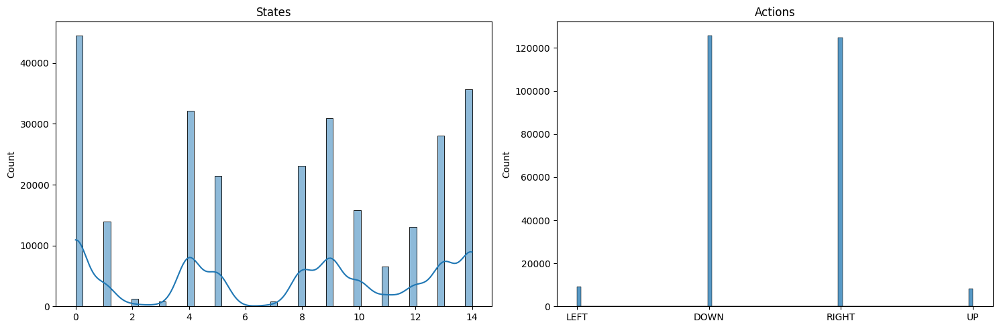

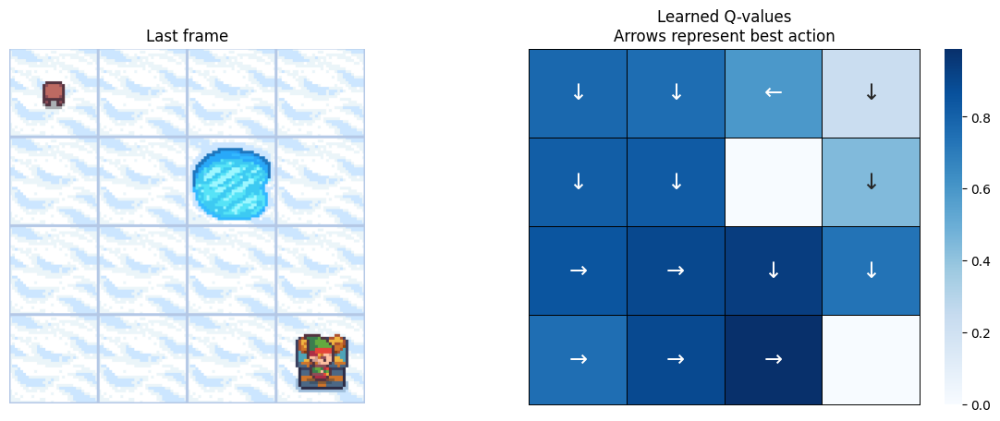

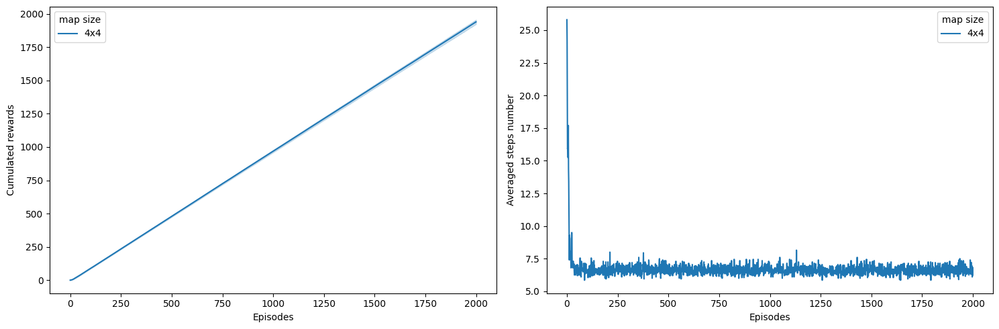

Map size: 7x7


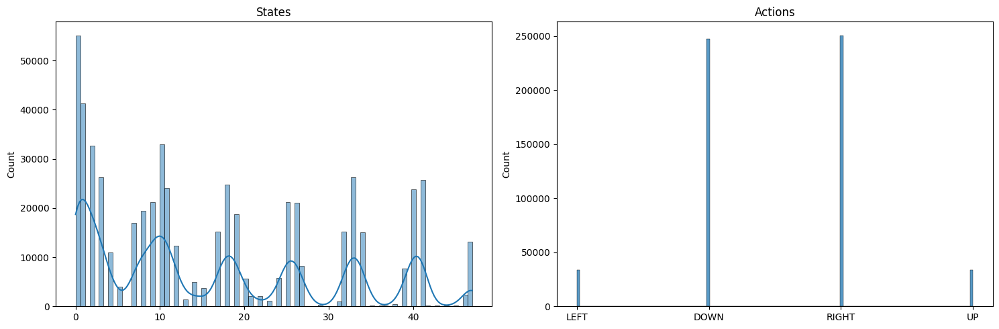

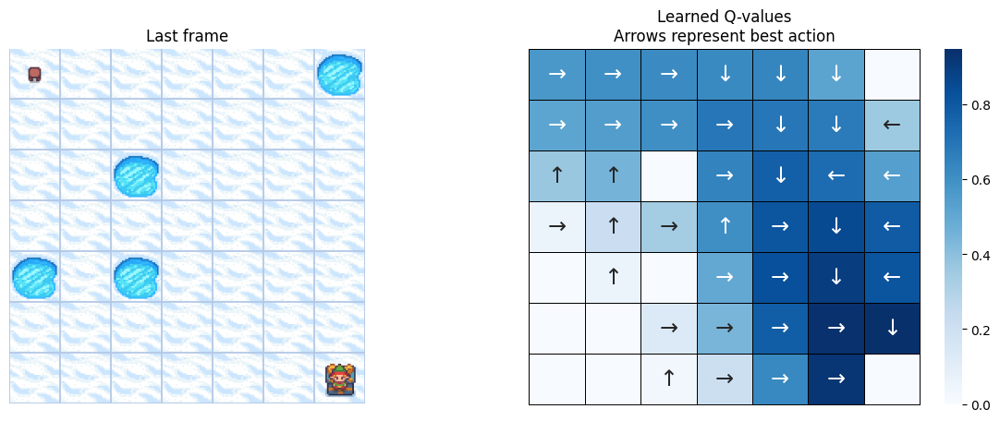

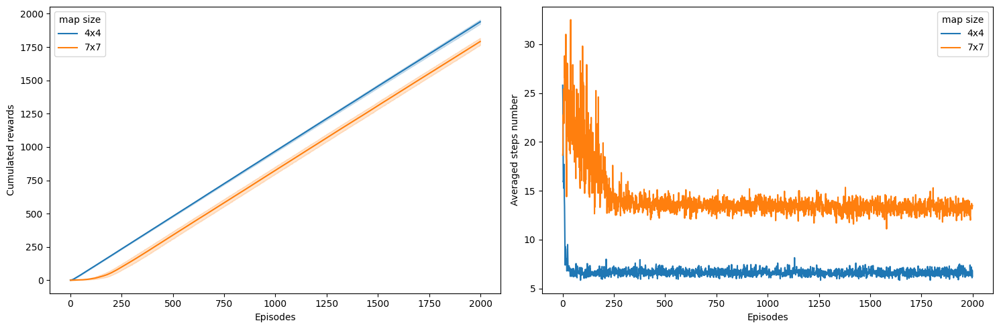

Map size: 9x9


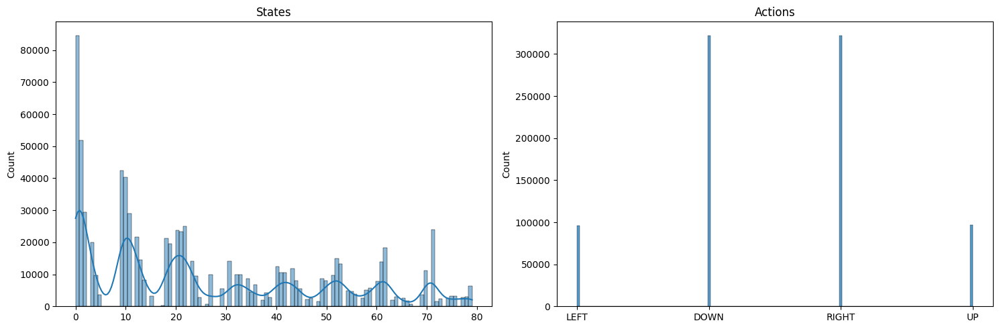

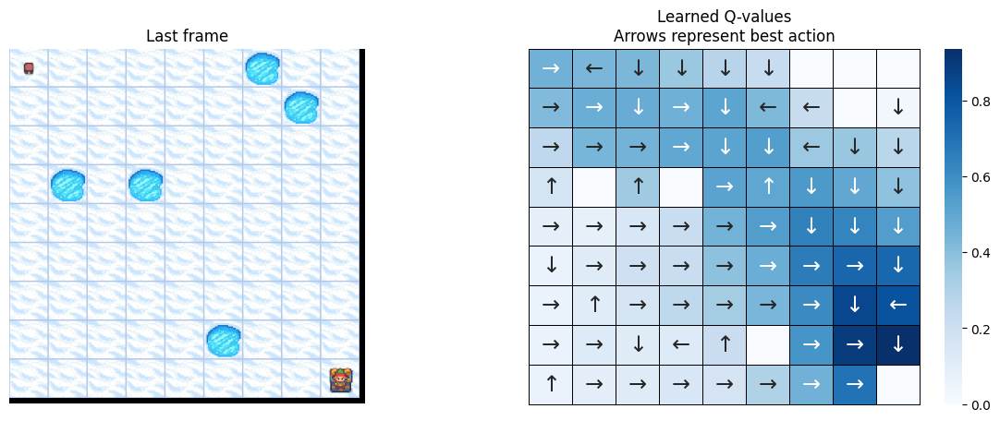

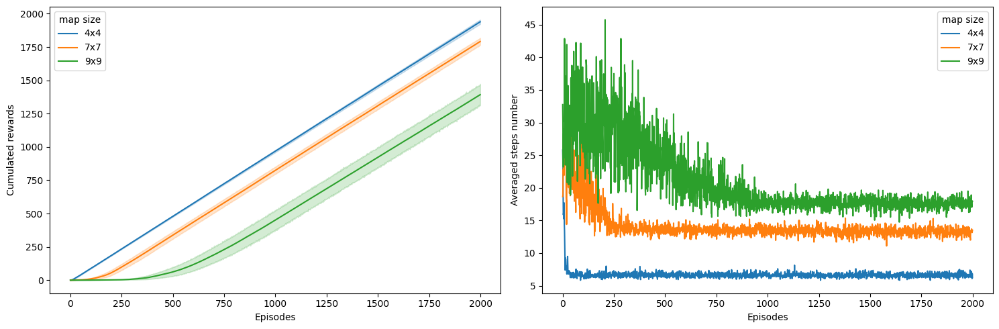

Map size: 11x11


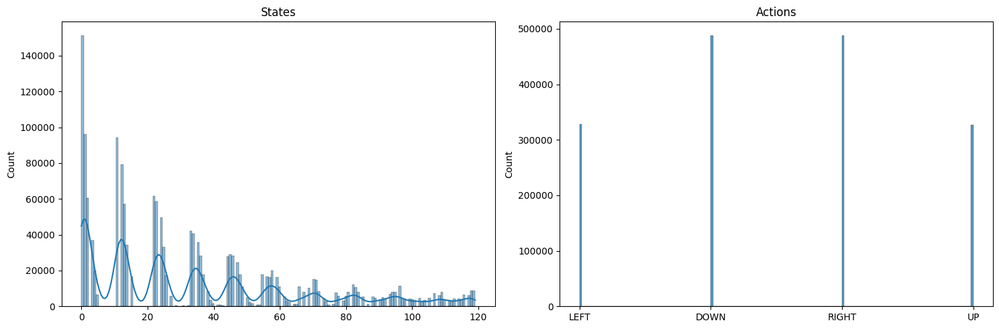

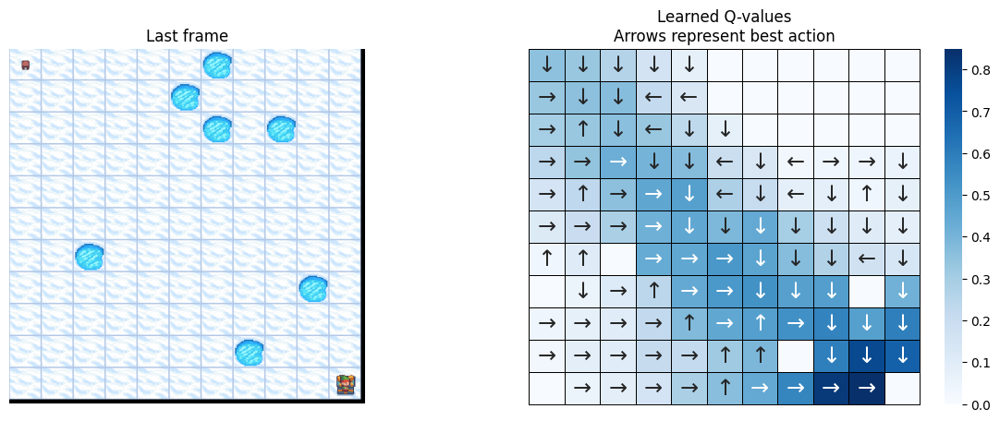

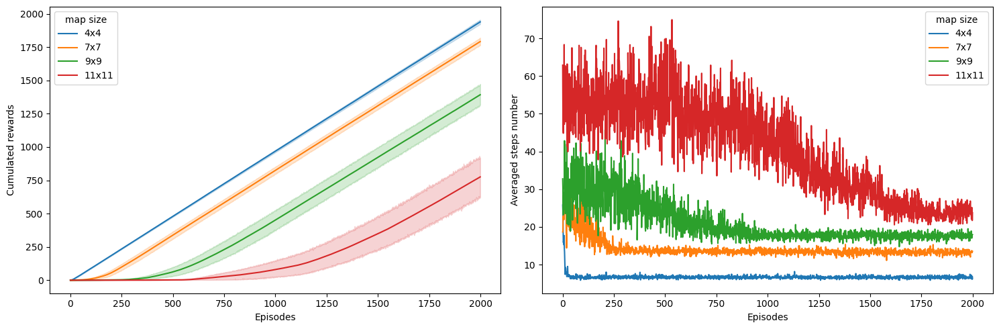

In [12]:
map_sizes = [4, 7, 9, 11]
res_all = pd.DataFrame()
st_all = pd.DataFrame()

for map_size in map_sizes:
    env = gym.make(
        "FrozenLake-v1",
        is_slippery=params.is_slippery,
        render_mode="rgb_array",
        desc=generate_random_map(
            size=map_size, p=params.proba_frozen, seed=params.seed
        ),
    )

    params = params._replace(action_size=env.action_space.n)
    params = params._replace(state_size=env.observation_space.n)
    env.action_space.seed(
        params.seed
    )  # Set the seed to get reproducible results when sampling the action space
    learner = Qlearning(
        learning_rate=params.learning_rate,
        gamma=params.gamma,
        state_size=params.state_size,
        action_size=params.action_size,
    )
    explorer = EpsilonGreedy(
        epsilon=params.epsilon,
    )

    print(f"Map size: {map_size}x{map_size}")
    rewards, steps, episodes, qtables, all_states, all_actions = run_env()

    # Save the results in dataframes
    res, st = postprocess(episodes, params, rewards, steps, map_size)
    res_all = pd.concat([res_all, res])
    st_all = pd.concat([st_all, st])
    qtable = qtables.mean(axis=0)  # Average the Q-table between runs

    plot_states_actions_distribution(
        states=all_states, actions=all_actions, map_size=map_size, 
        gamma=params.gamma, lr=params.learning_rate
    )  # Sanity check
    plot_q_values_map(qtable, env, map_size, params.gamma, params.learning_rate)
    plot_steps_and_rewards(res_all, st_all, params.gamma, params.learning_rate)

    env.close()

# Running Code with changed gamma values

Map size: 4x4 | Gamma: 0.01


Cumulative reward: 1919.0


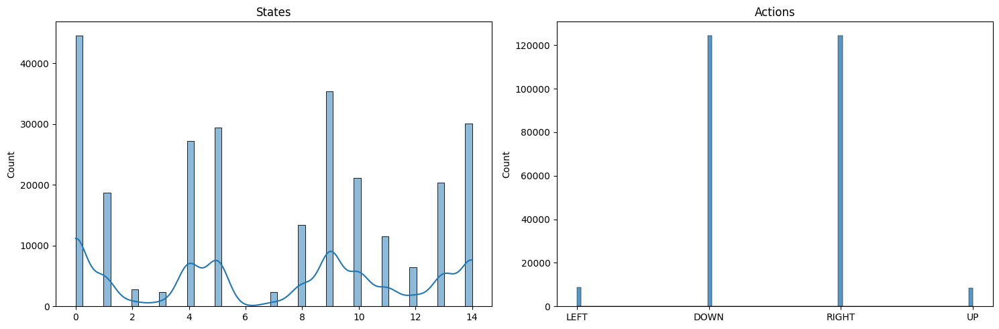

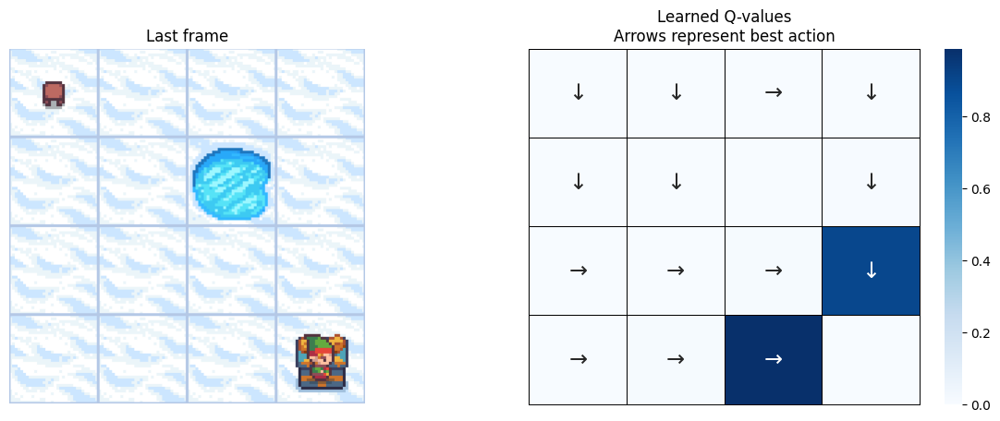

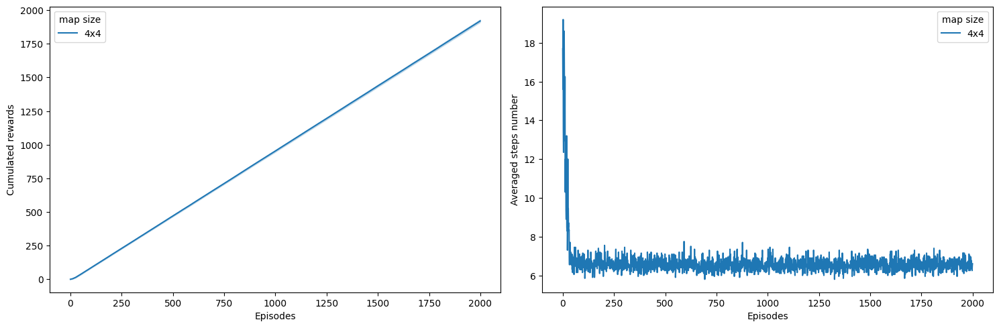

Map size: 4x4 | Gamma: 0.2


Cumulative reward: 1958.0


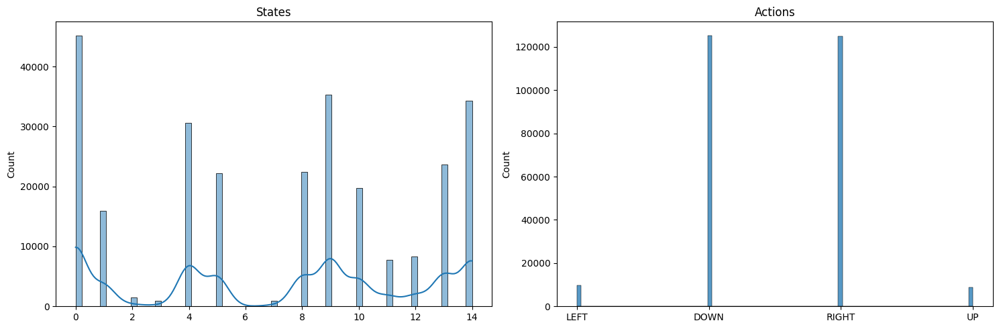

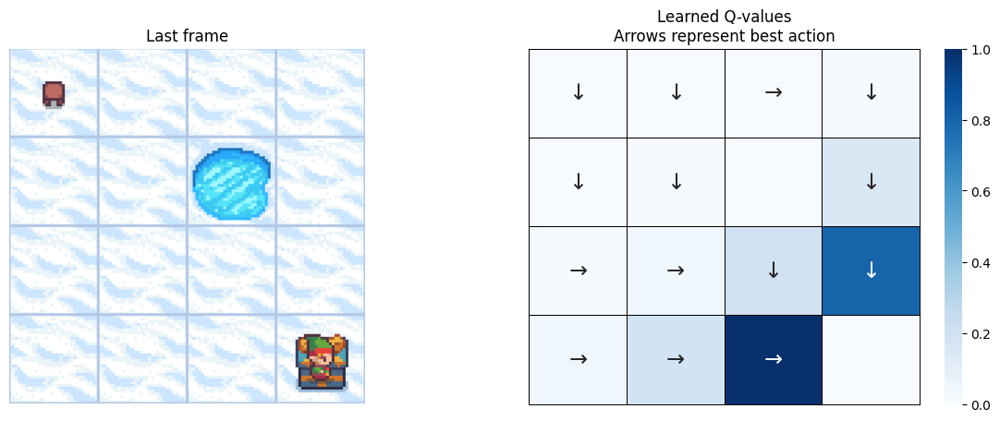

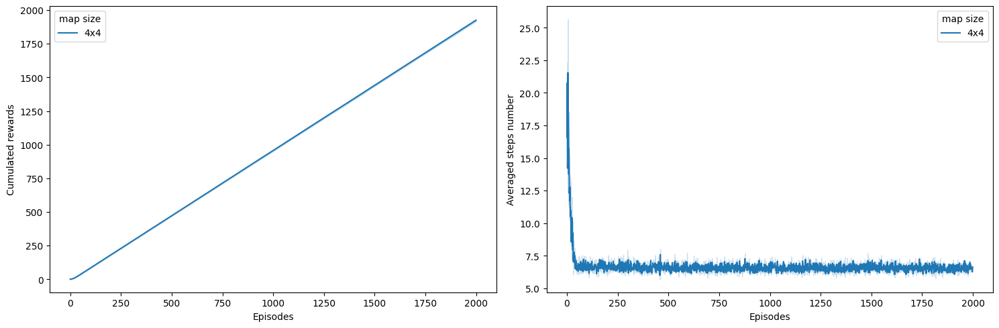

Map size: 4x4 | Gamma: 0.5


Cumulative reward: 1914.0


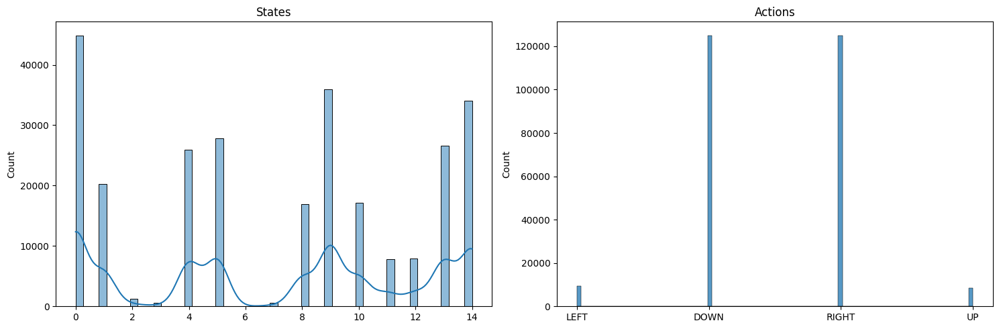

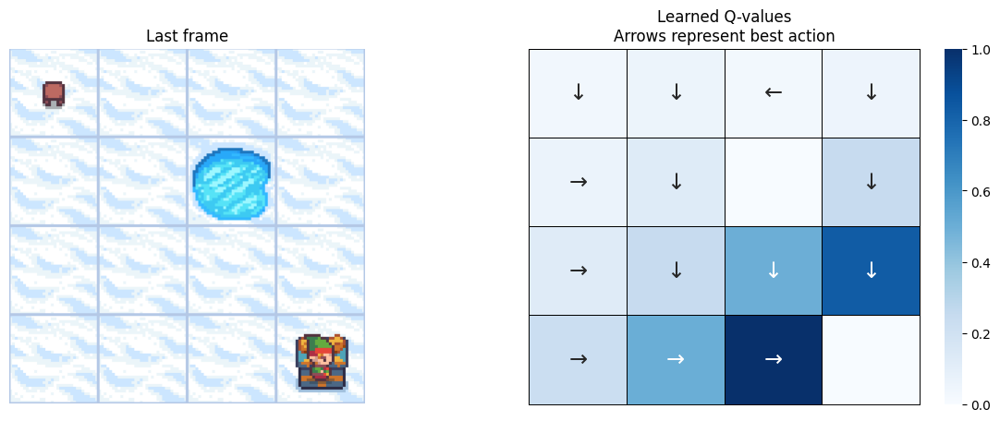

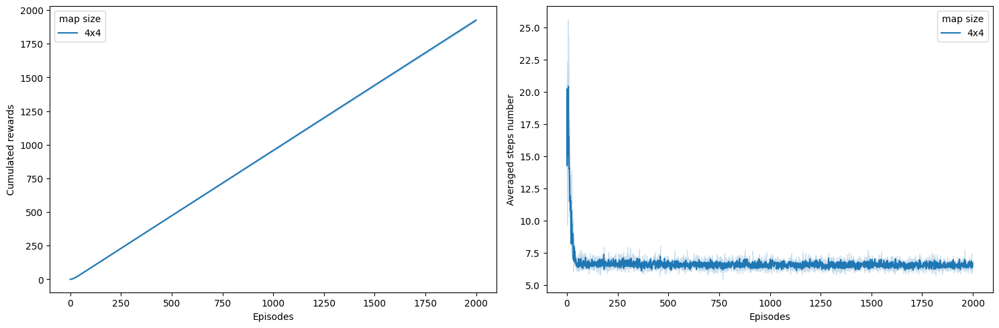

Map size: 4x4 | Gamma: 0.99


Cumulative reward: 1887.0


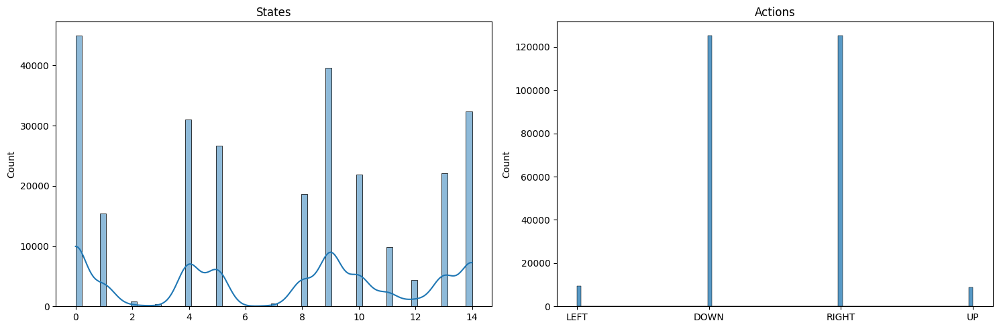

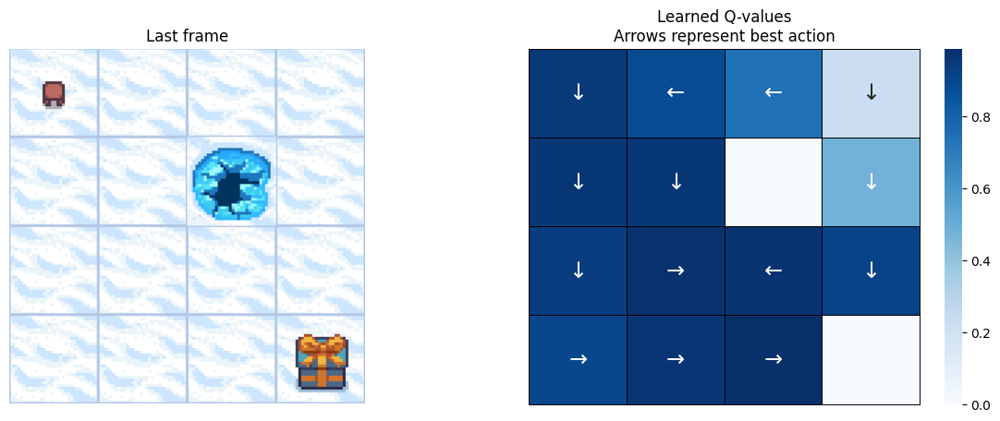

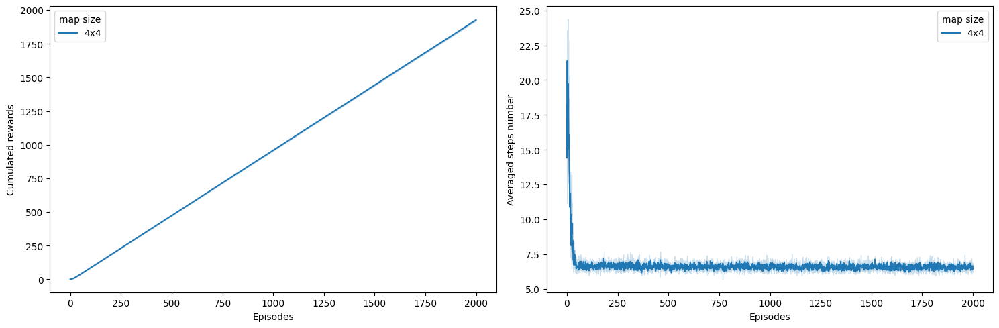

Map size: 7x7 | Gamma: 0.01


Cumulative reward: 1689.0


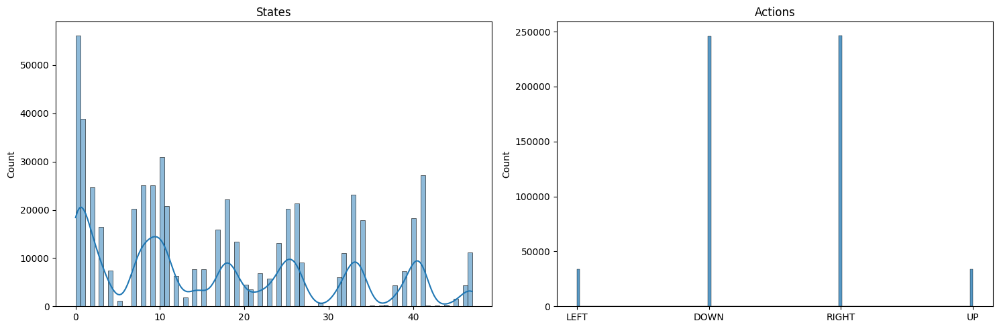

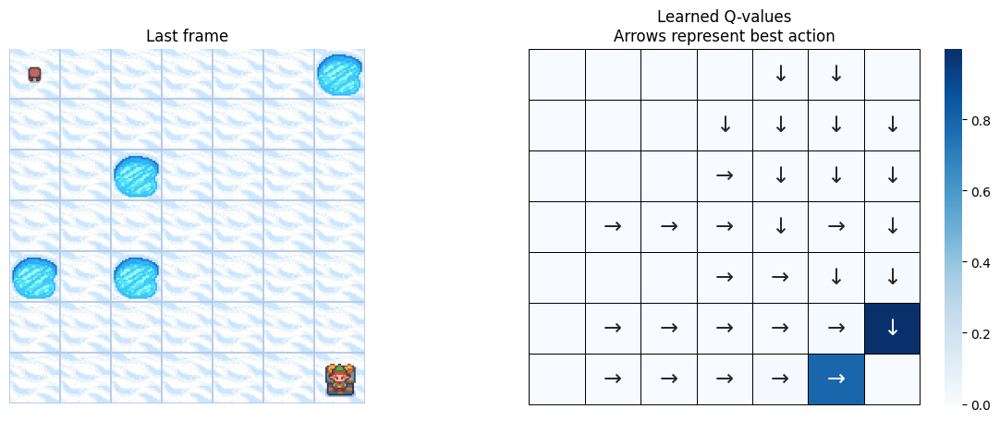

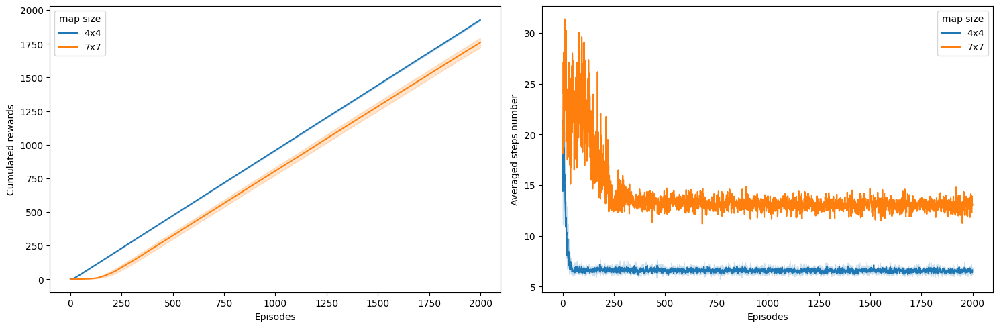

Map size: 7x7 | Gamma: 0.2


Cumulative reward: 1755.0


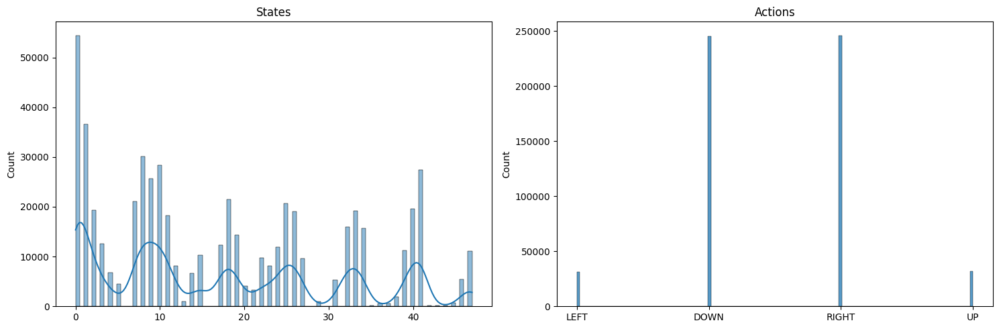

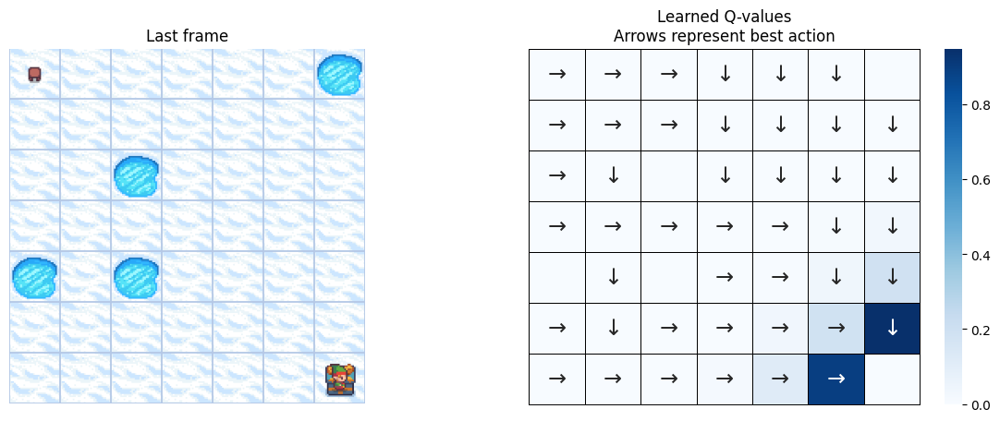

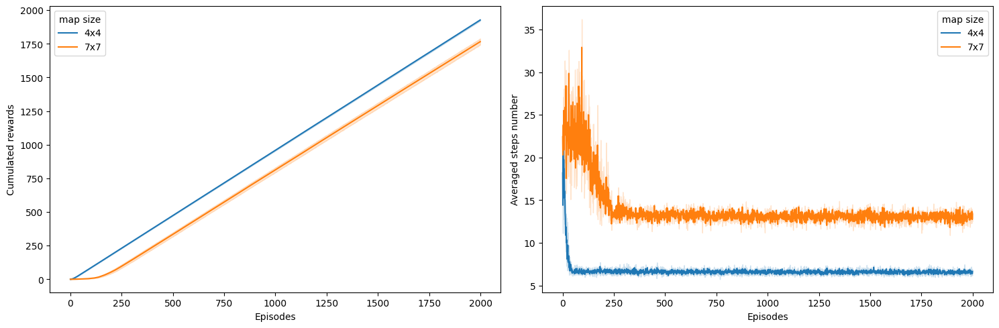

Map size: 7x7 | Gamma: 0.5


Cumulative reward: 1785.0


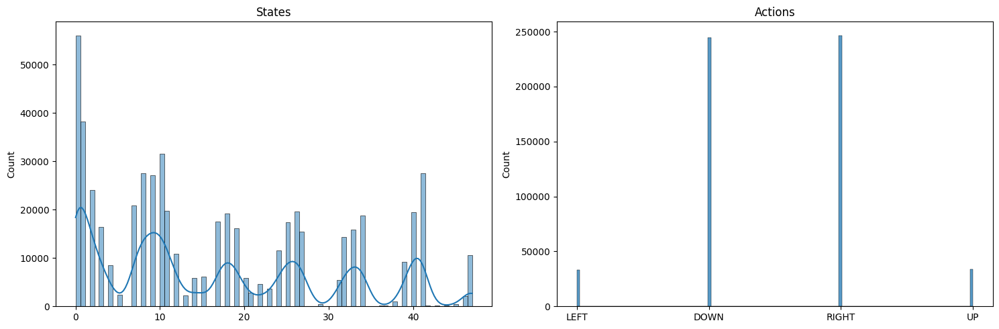

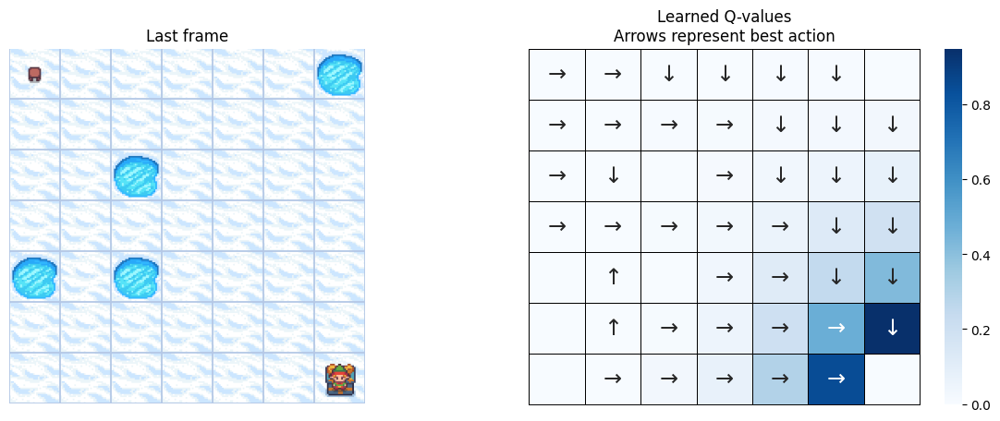

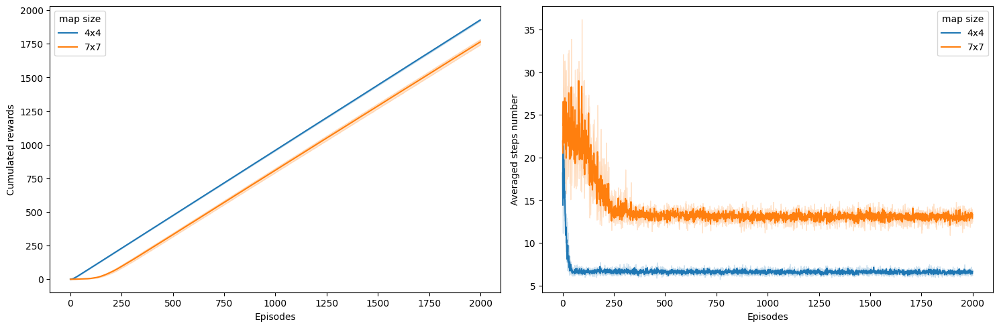

Map size: 7x7 | Gamma: 0.99


Cumulative reward: 1722.0


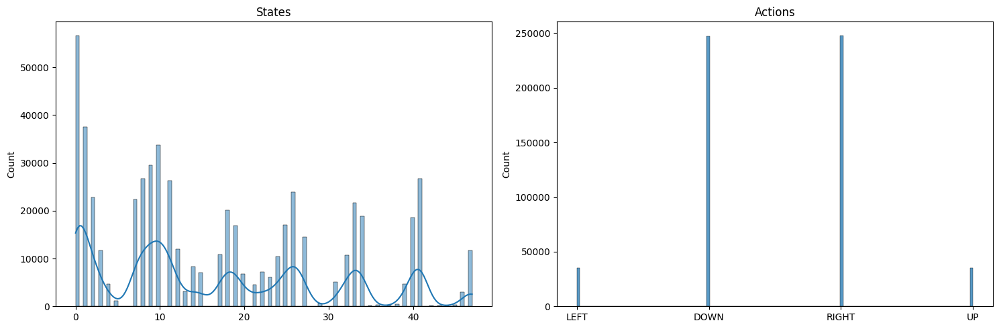

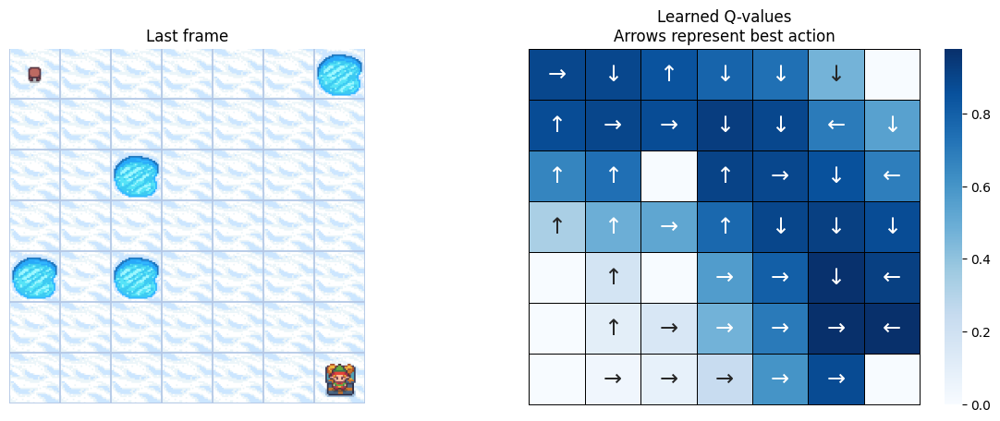

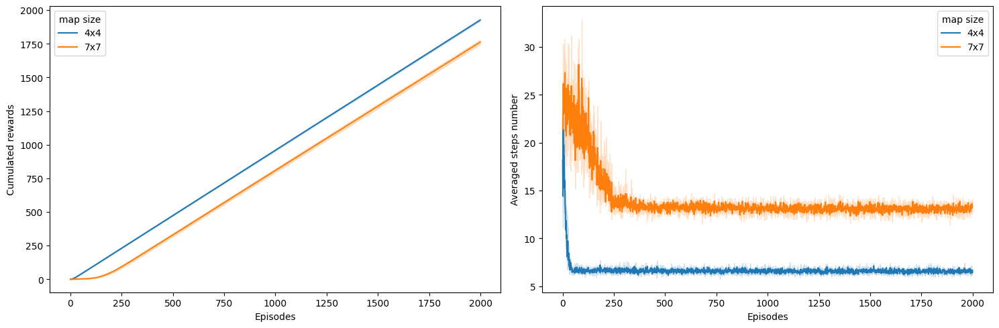

Map size: 9x9 | Gamma: 0.01


Cumulative reward: 1344.0


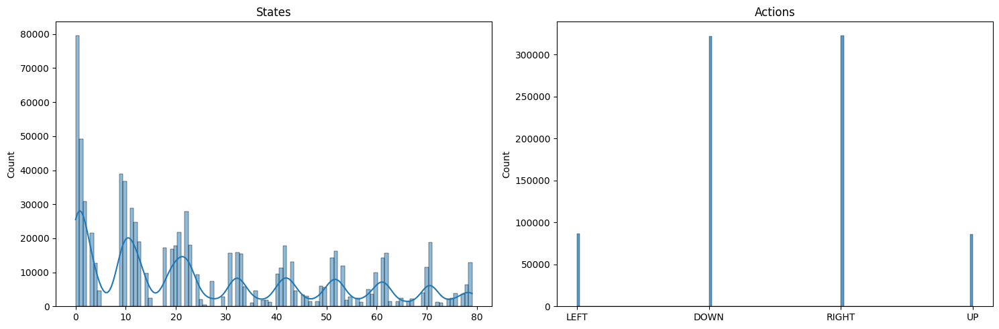

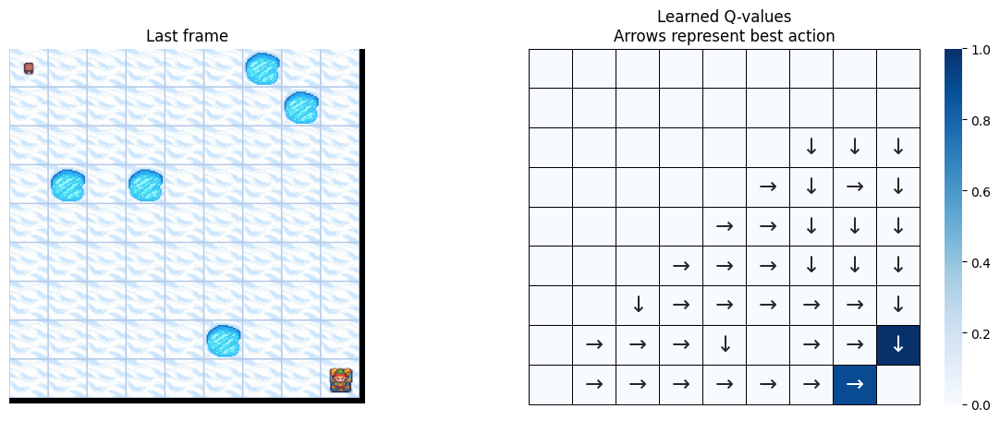

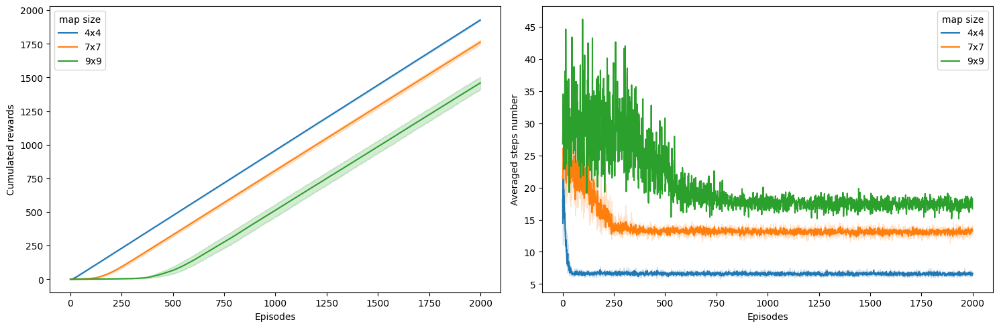

Map size: 9x9 | Gamma: 0.2


Cumulative reward: 1342.0


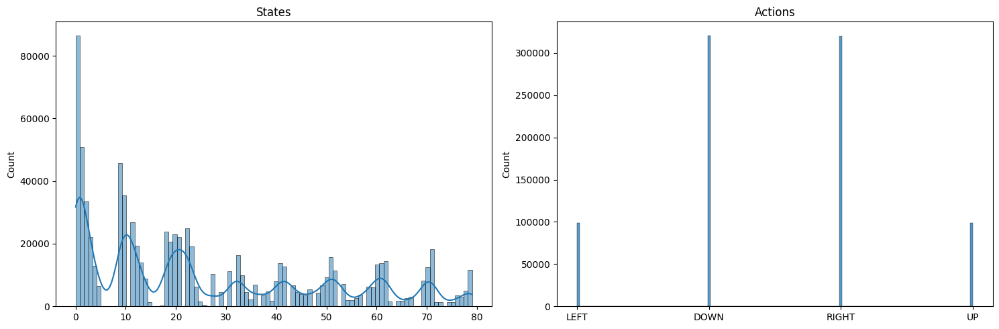

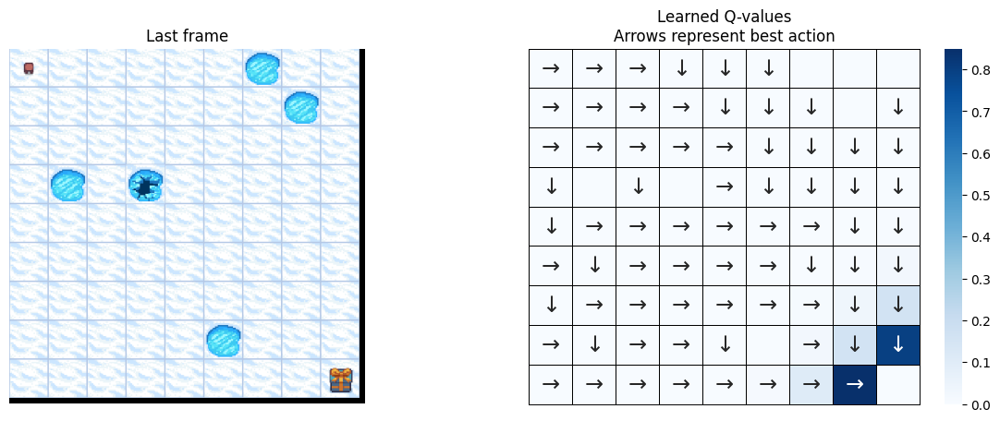

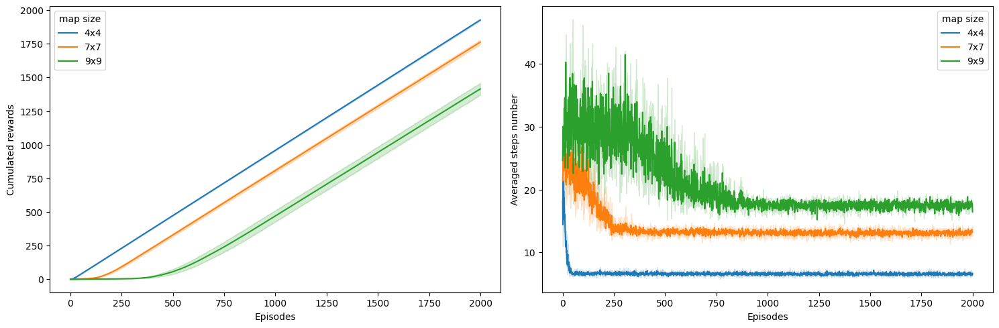

Map size: 9x9 | Gamma: 0.5


Cumulative reward: 1737.0


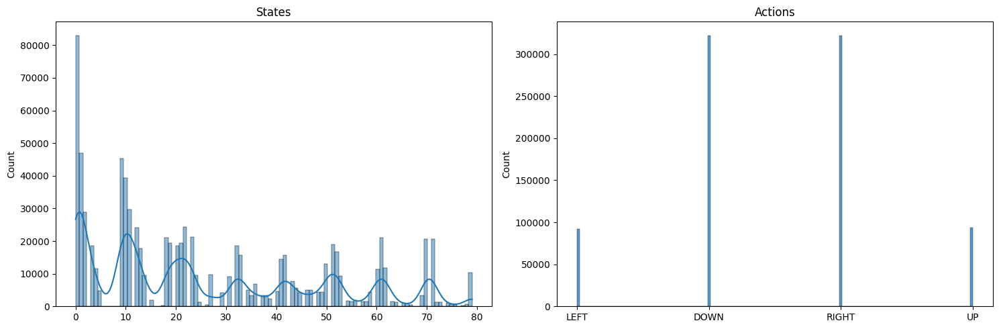

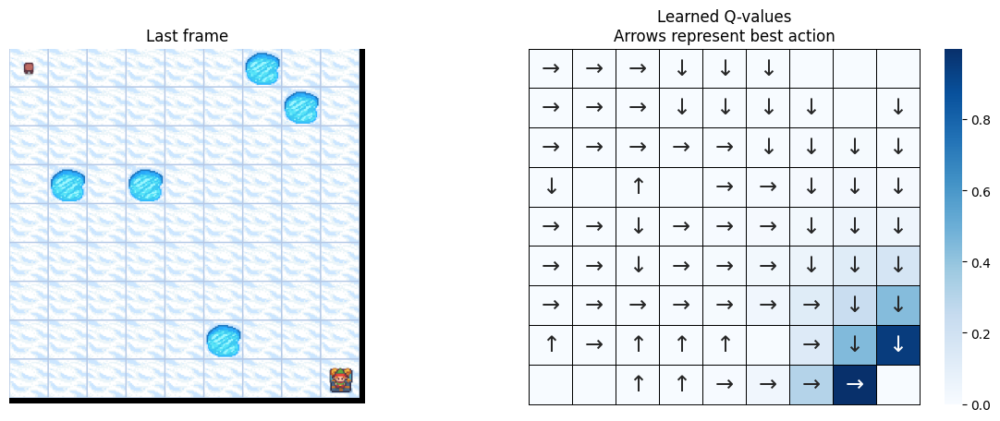

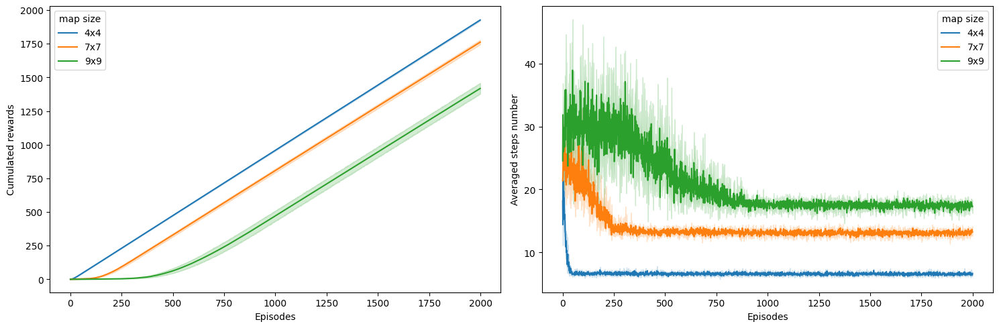

Map size: 9x9 | Gamma: 0.99


Cumulative reward: 1276.0


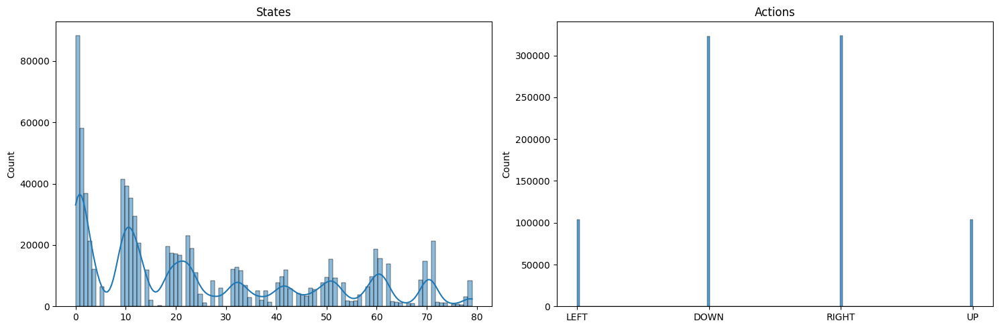

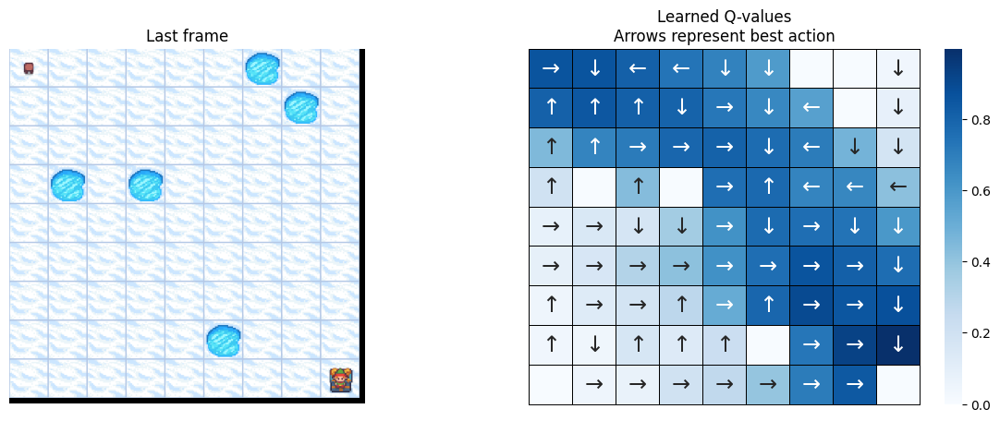

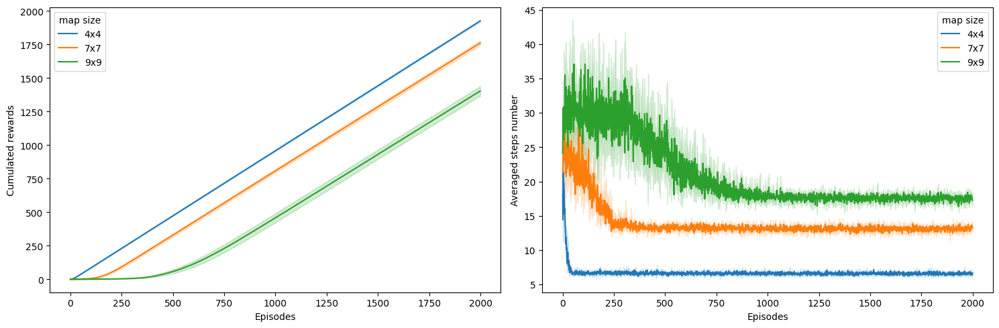

Map size: 11x11 | Gamma: 0.01


Cumulative reward: 867.0


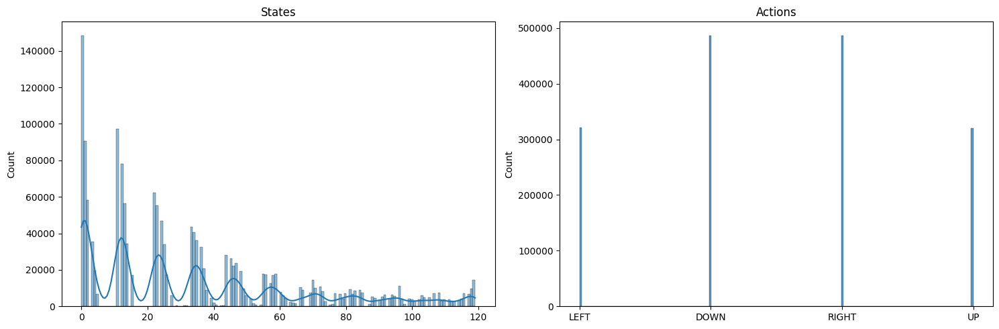

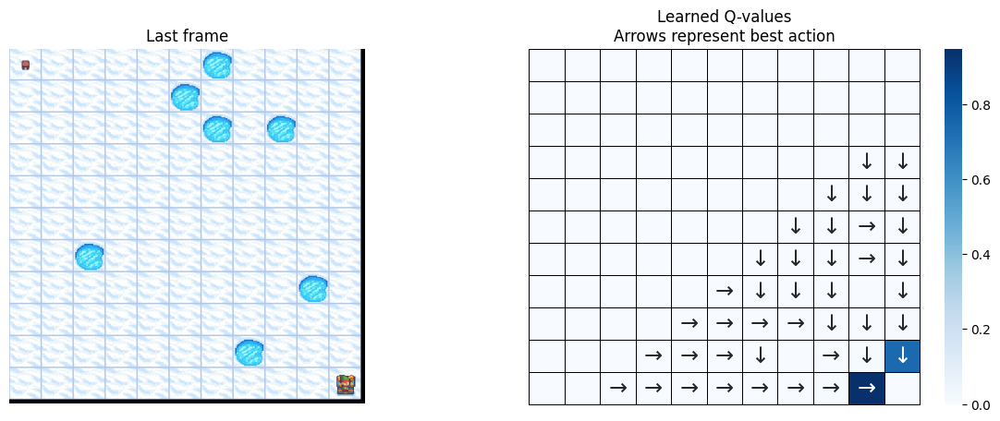

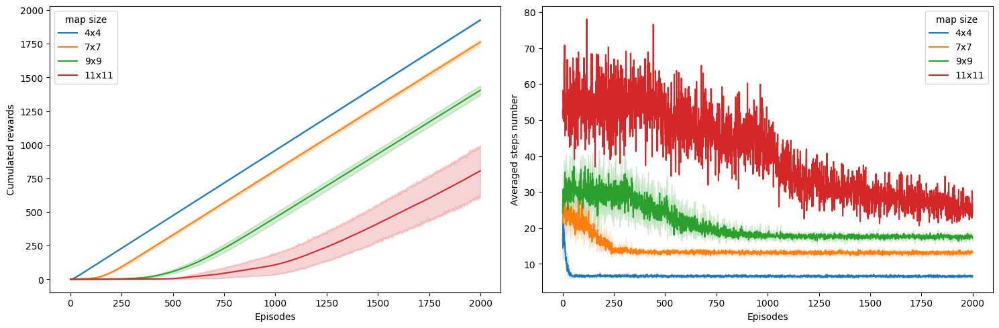

Map size: 11x11 | Gamma: 0.2


Cumulative reward: 1392.0


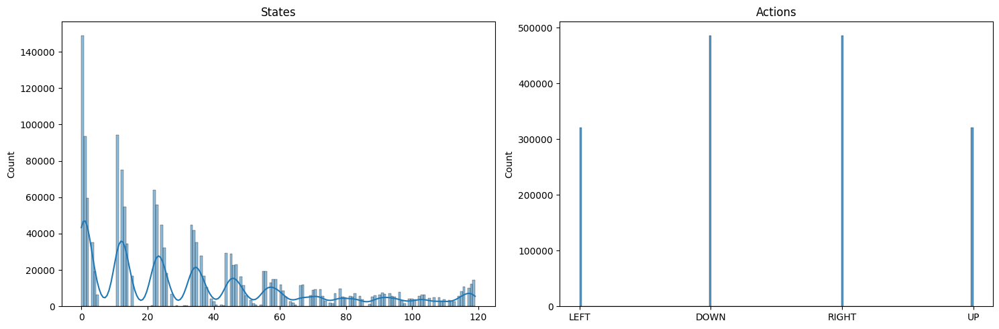

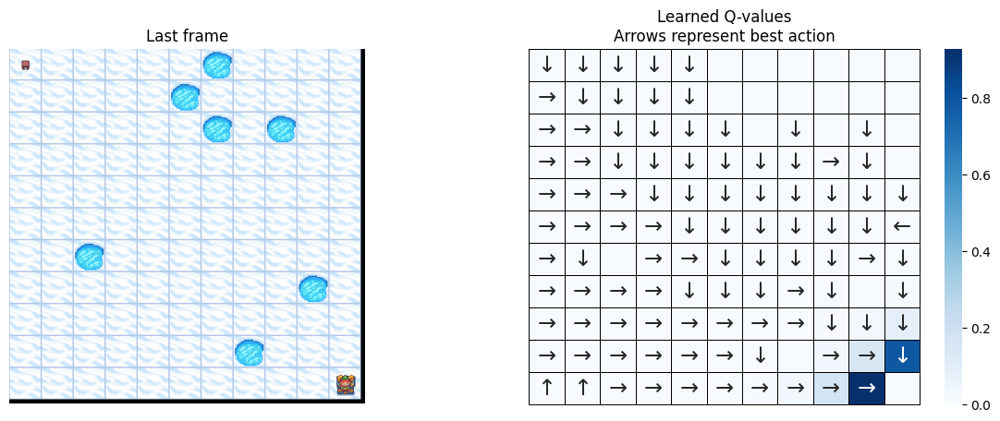

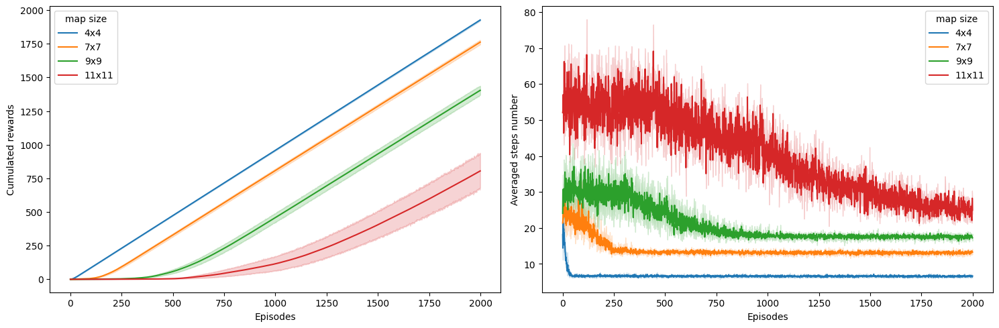

Map size: 11x11 | Gamma: 0.5


Cumulative reward: 1549.0


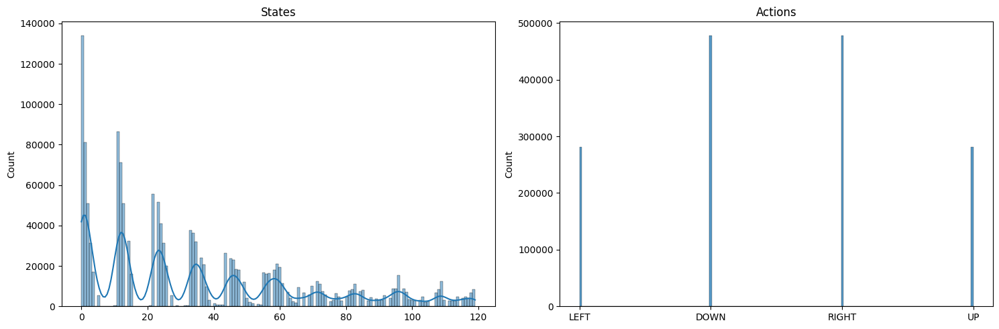

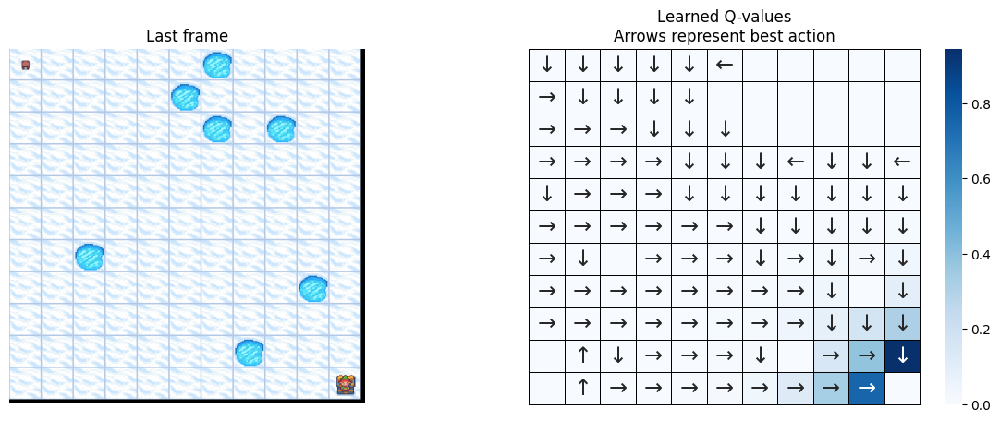

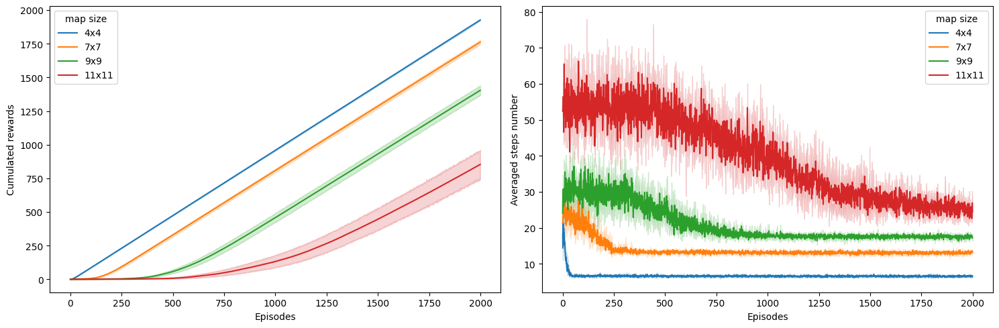

Map size: 11x11 | Gamma: 0.99


Cumulative reward: 698.0


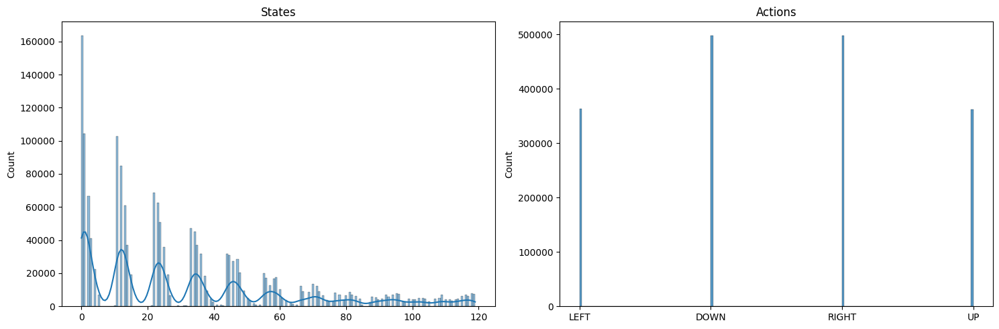

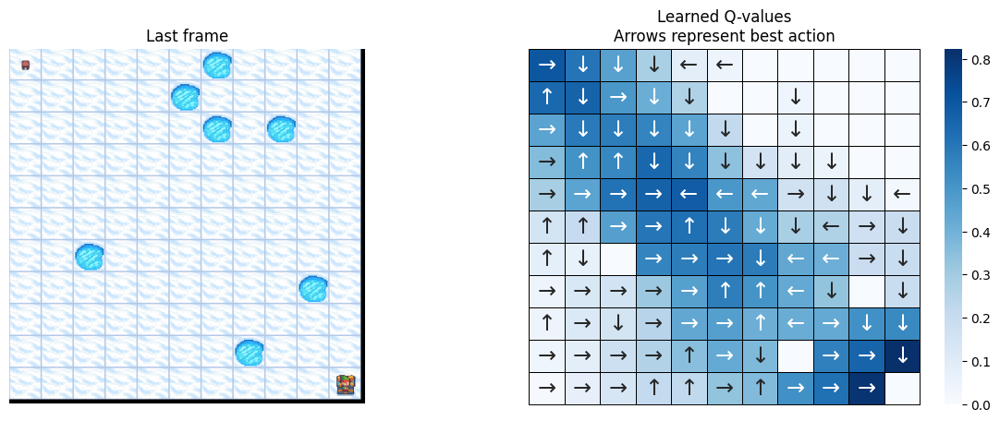

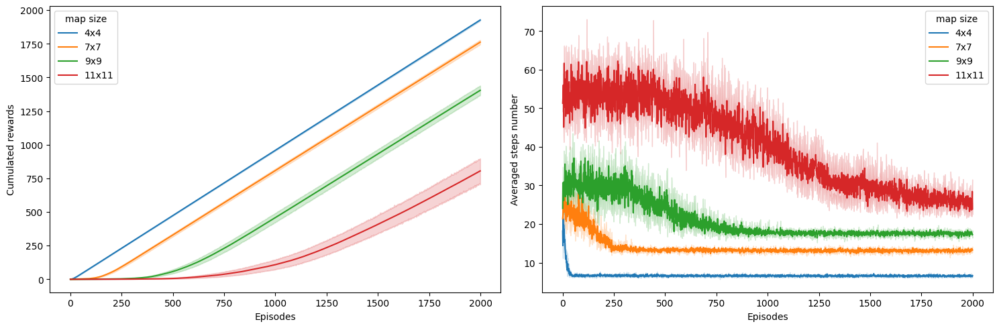

In [13]:
gamma_values = [0.01, 0.2, 0.5, 0.99]
map_sizes = [4, 7, 9, 11]
res_all = pd.DataFrame()
st_all = pd.DataFrame()

for map_size in map_sizes:
    for gamma in gamma_values:
        print(f"Map size: {map_size}x{map_size} | Gamma: {gamma}")

        env = gym.make(
            "FrozenLake-v1",
            is_slippery=params.is_slippery,
            render_mode="rgb_array",
            desc=generate_random_map(
                size=map_size, p=params.proba_frozen, seed=params.seed
            ),
        )

        params = params._replace(
            action_size=env.action_space.n,
            state_size=env.observation_space.n,
            gamma=gamma
        )

        env.action_space.seed(params.seed)

        learner = Qlearning(
            learning_rate=params.learning_rate,
            gamma=params.gamma,
            state_size=params.state_size,
            action_size=params.action_size,
        )
        explorer = EpsilonGreedy(
            epsilon=params.epsilon,
        )

        rewards, steps, episodes, qtables, all_states, all_actions = run_env()

        res, st = postprocess(episodes, params, rewards, steps, map_size)

        # Printing cumulative reward
        cumulative_reward = res['cum_rewards'].iloc[-1]
        print(f"Cumulative reward: {cumulative_reward}")
        
        res["gamma"] = gamma
        st["gamma"] = gamma
        res_all = pd.concat([res_all, res])
        st_all = pd.concat([st_all, st])
        qtable = qtables.mean(axis=0)

        plot_states_actions_distribution(
            states=all_states, actions=all_actions, map_size=map_size, 
            gamma=params.gamma, lr=params.learning_rate
        )
        plot_q_values_map(qtable, env, map_size, params.gamma, params.learning_rate)
        plot_steps_and_rewards(res_all, st_all, params.gamma, params.learning_rate)
        
        env.close()


## Relationship Between Gamma and Cumulative Reward

In this experiment, I varied the discount factor (gamma) across values of 0.01, 0.2, 0.5, and 0.99 to observe its impact on cumulative rewards in the Frozen Lake environment across different map sizes (4x4, 7x7, 9x9 and 11x11). Overall I observed that there was a clear trend here: cumulative rewards were higher when gamma values are medium and low when extremely low or extremely high gamma values.

For the 4x4 map, cumulative rewards remained relatively stable at every gamma setting but the highest reward was at gamma = 0.2. As I increased gamma to 0.99, I noticed a slight decrease in performance. On the 7x7 map the cumulative rewards improved when gamma was set to 0.2 and 0.5, suggesting that the agent benefited from moderately balancing immediate and future rewards. Lower and higher gamma values (0.01 and 0.99) resulted in lower performance. I observed the same pattern on the 9x9 map where gamma = 0.5 provided the maximum cumulative reward. At the extremes (0.01 and 0.99), the performance of the agent significantly reduced. For the 11x11 map, cumulative rewards were notably higher at gamma = 0.5 and substantially lower when gamma was set to 0.99, indicating that an overemphasis on long-term rewards negatively impacted navigation in larger and more complex environments.

Based on these results, I concluded that a very low gamma value, such as 0.01, caused the agent to focus almost entirely on immediate rewards, which was inadequate for environments where reaching the goal required a series of deliberate, future-oriented actions. However a very high gamma of 0.99 made the agent focus too much on distant rewards. This long term focus had the tendency to create inefficient or risky behavior especially on large maps with many pitfalls. The moderate gamma values particularly in the range of 0.2 to 0.5 struck the perfect balance by appropriately weighting the immediate reward and future rewards leading to safer and more efficient routes to the target.

---

### Summary Table: Gamma vs Cumulative Rewards

| Map Size | Gamma = 0.01 | Gamma = 0.2 | Gamma = 0.5 | Gamma = 0.99 |
|:--------:|:------------:|:-----------:|:-----------:|:------------:|
| 4x4      | 1919.0       | 1958.0      | 1914.0      | 1887.0       |
| 7x7      | 1689.0       | 1755.0      | 1785.0      | 1722.0       |
| 9x9      | 1344.0       | 1342.0      | 1737.0      | 1276.0       |
| 11x11    | 867.0        | 1392.0      | 1549.0      | 698.0        |


# Changing the Learning Rate Values

Map size: 4x4 | Learning Rate: 0.01


Cumulative reward: 1990.0


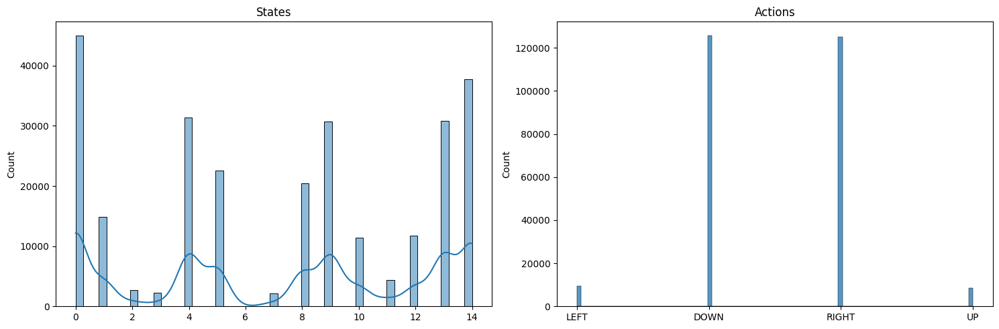

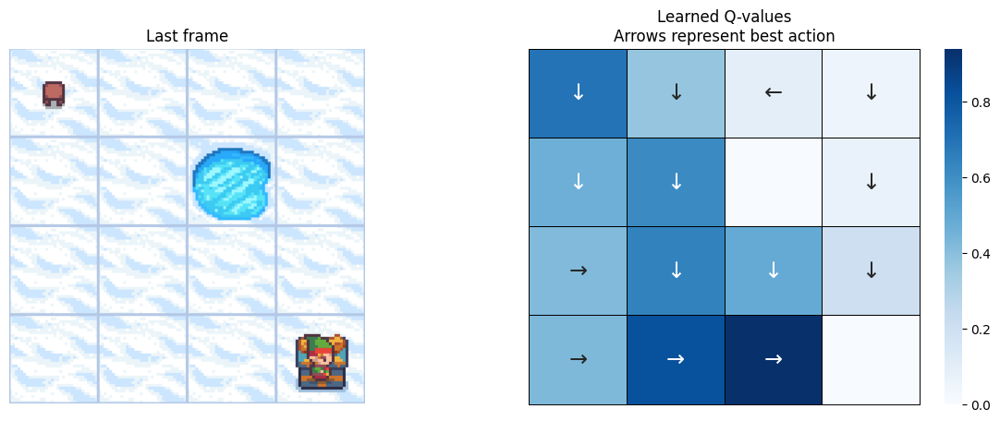

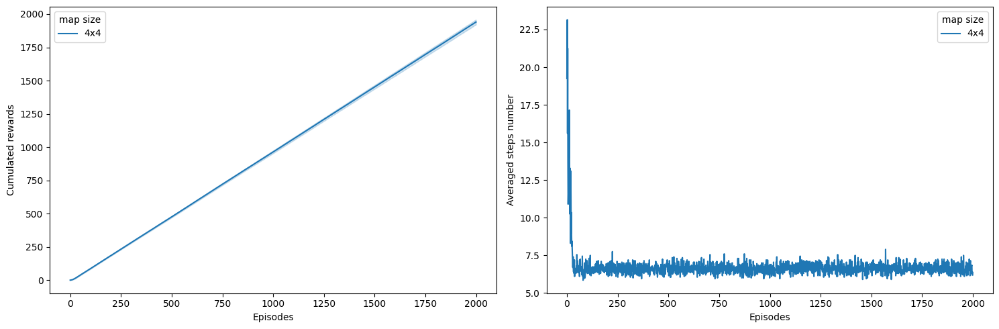

Map size: 4x4 | Learning Rate: 0.5


Cumulative reward: 1932.0


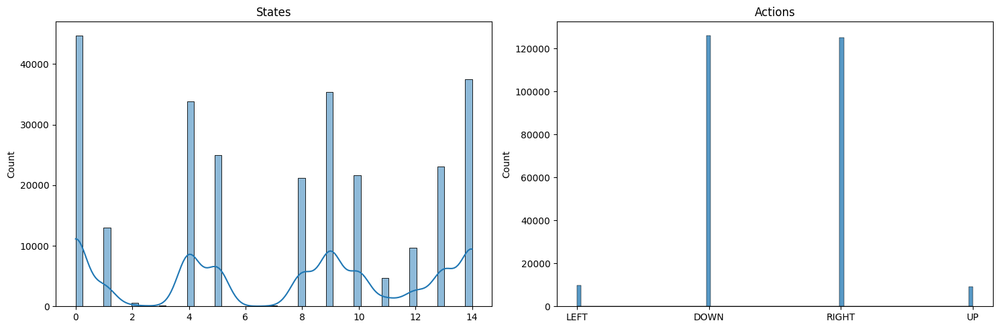

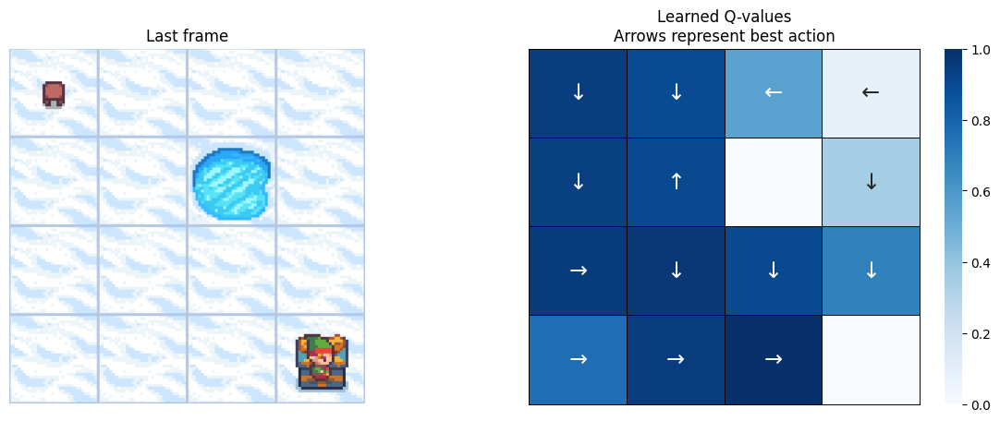

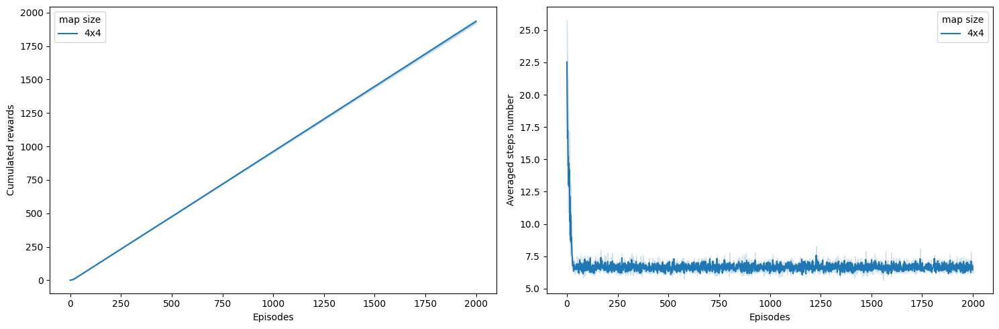

Map size: 4x4 | Learning Rate: 0.9


Cumulative reward: 1923.0


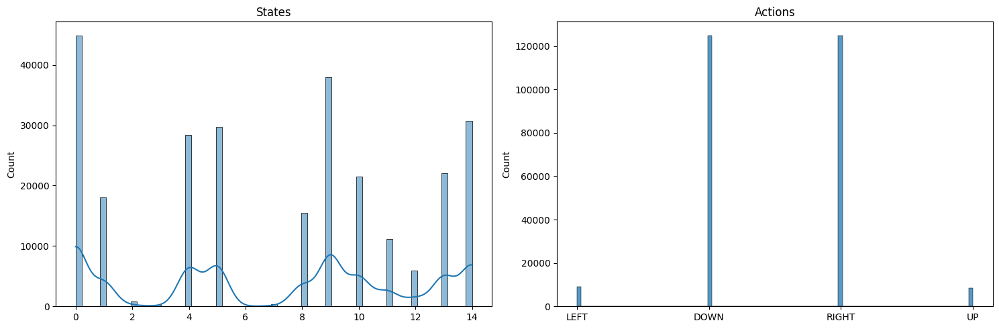

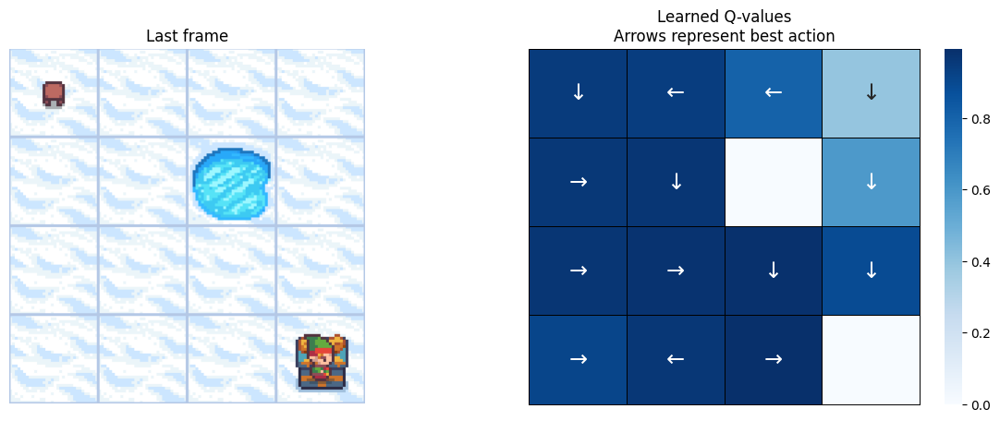

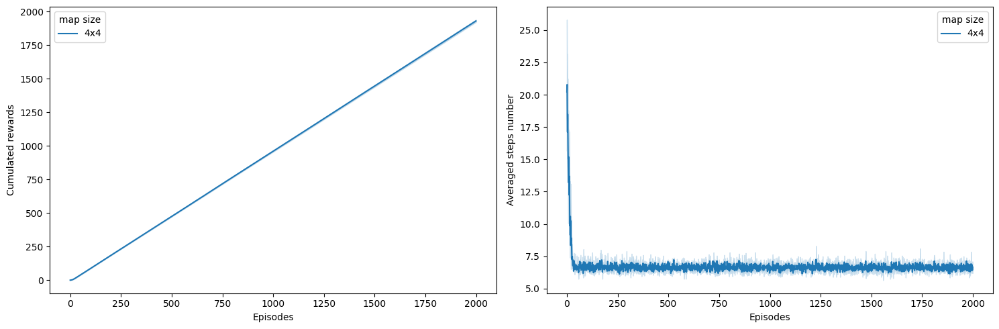

Map size: 7x7 | Learning Rate: 0.01


Cumulative reward: 1808.0


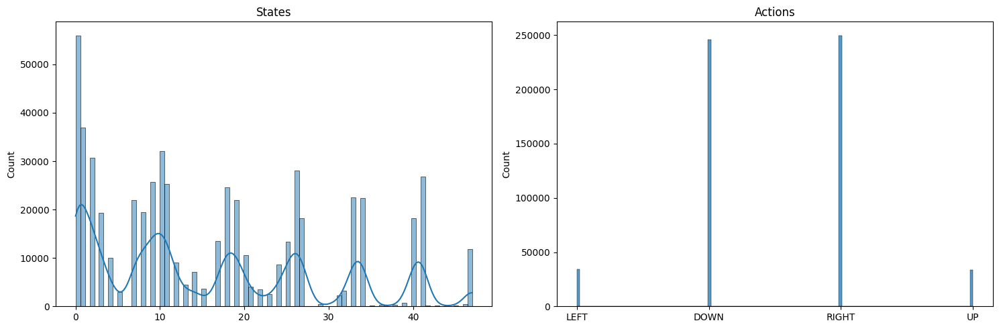

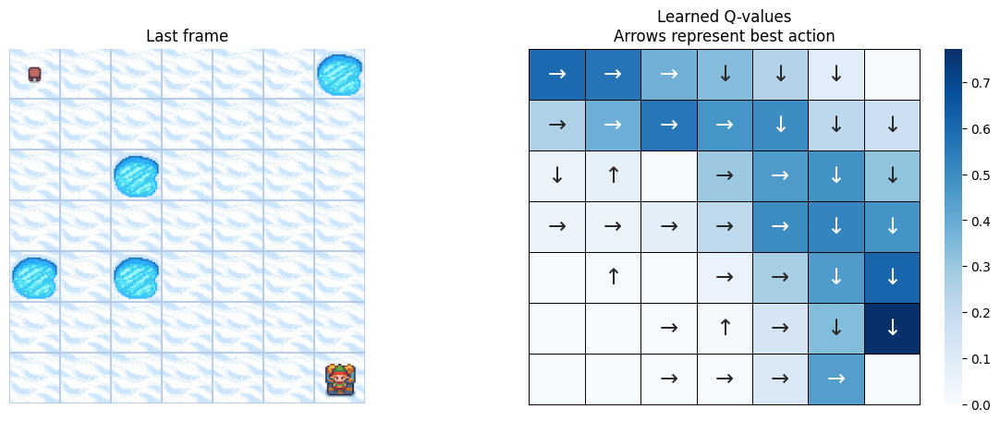

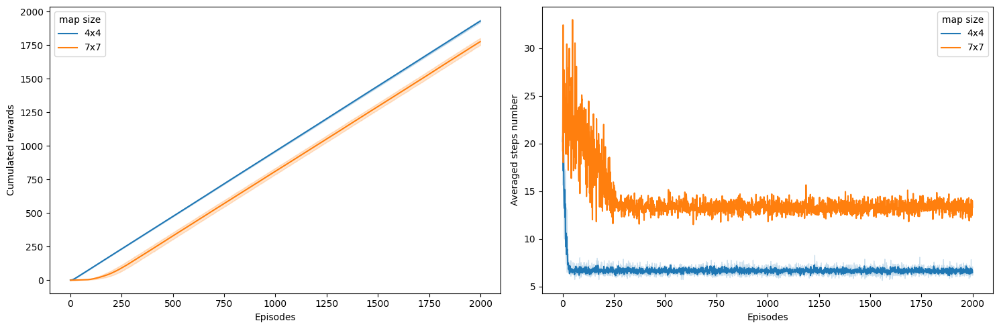

Map size: 7x7 | Learning Rate: 0.5


Cumulative reward: 1763.0


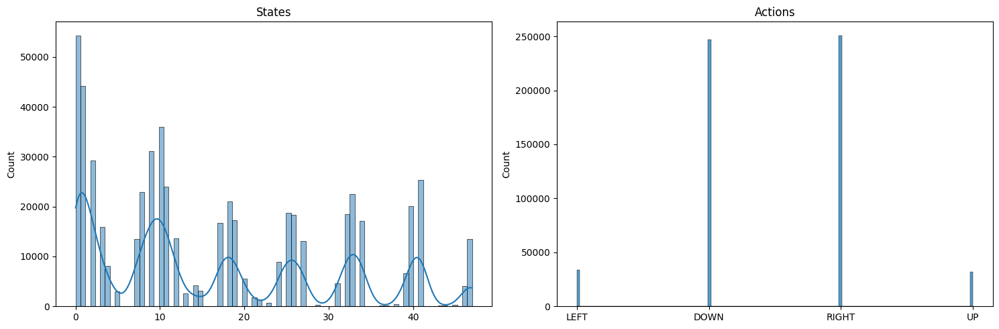

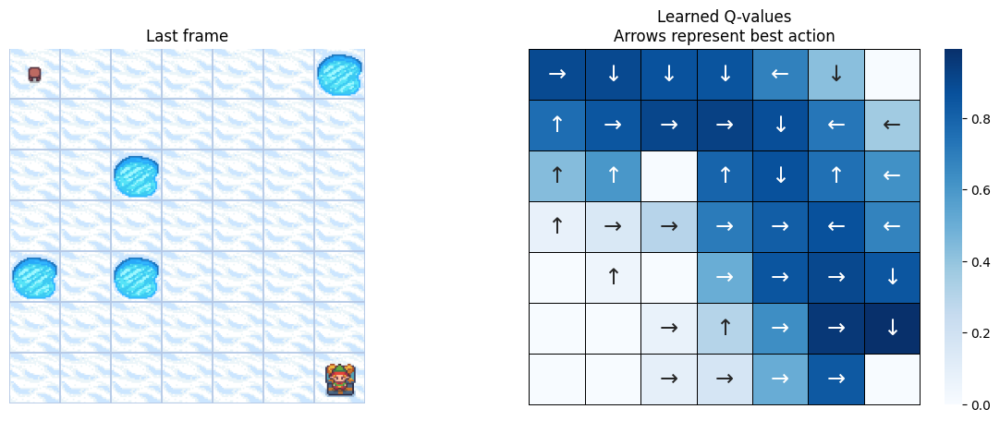

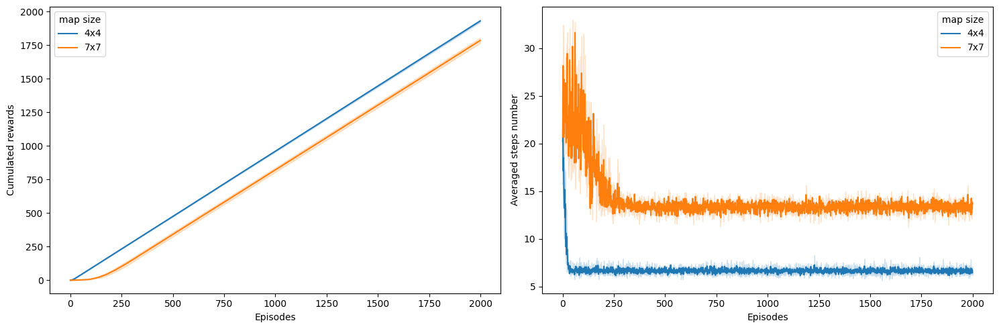

Map size: 7x7 | Learning Rate: 0.9


Cumulative reward: 1715.0


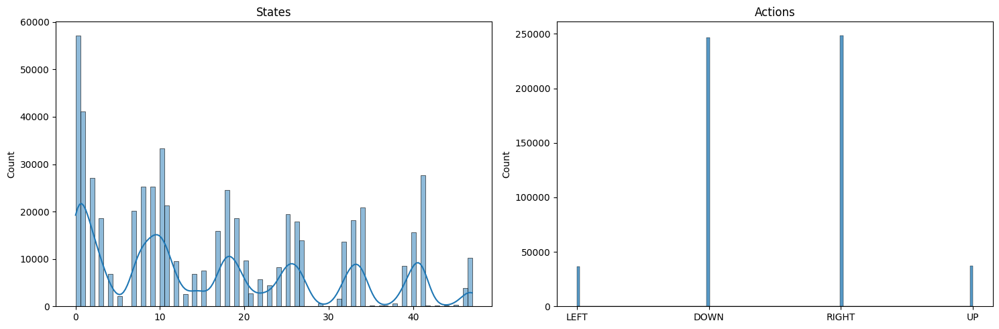

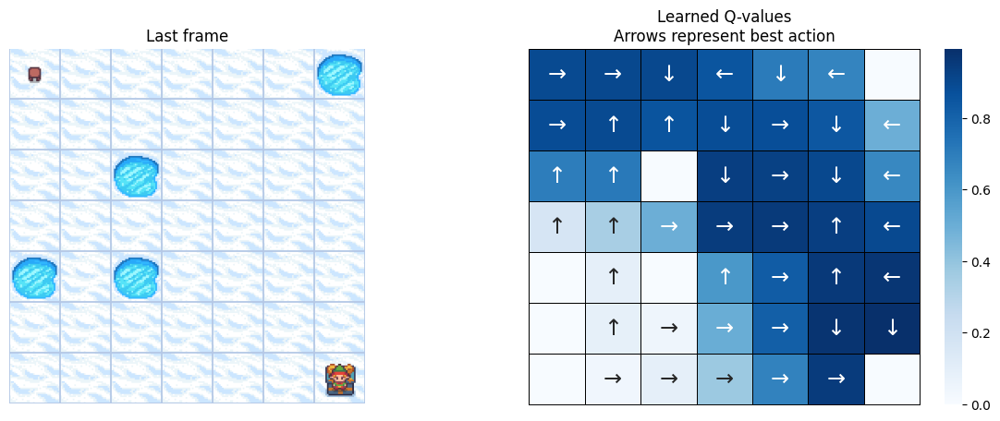

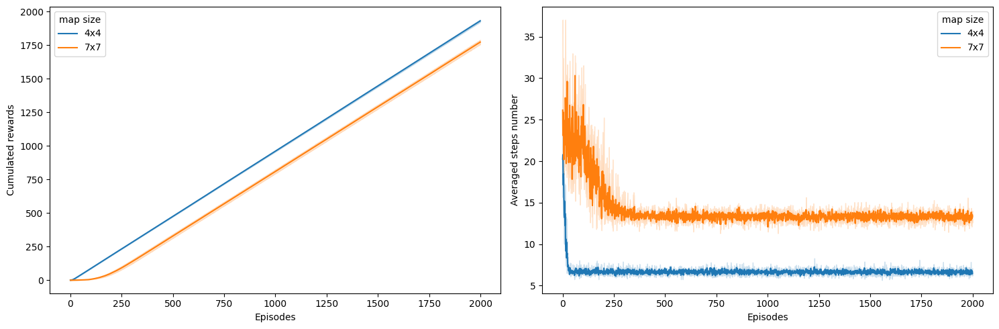

Map size: 9x9 | Learning Rate: 0.01


Cumulative reward: 1242.0


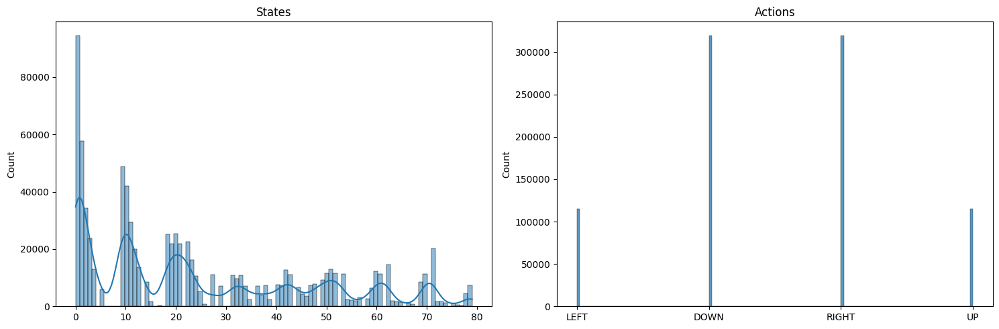

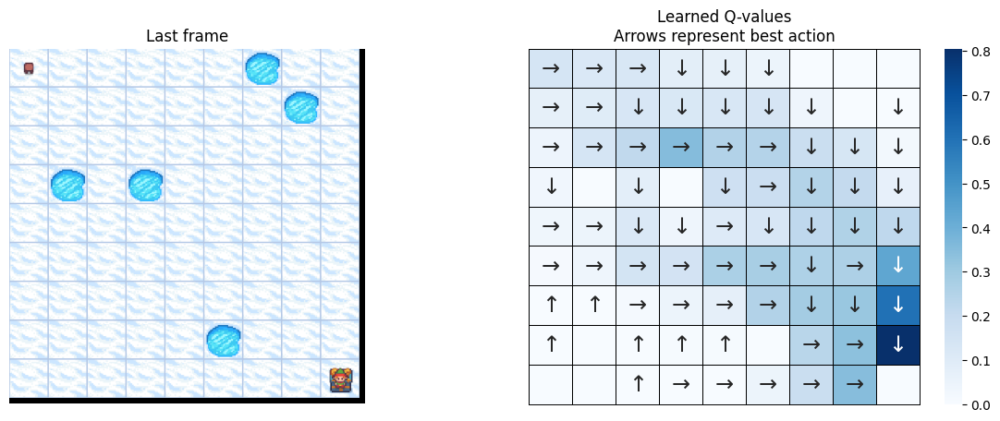

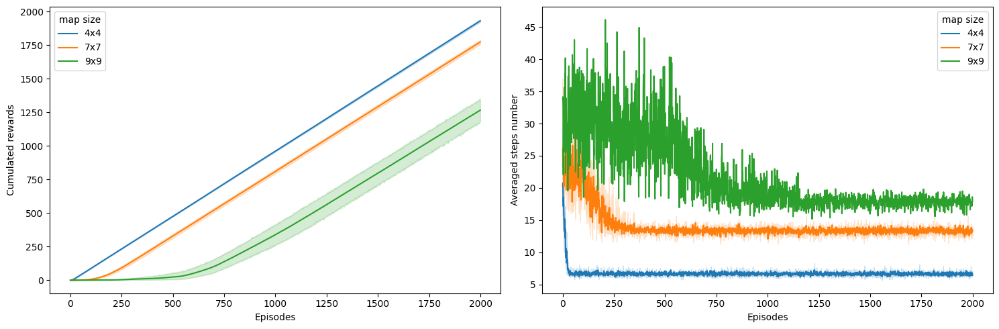

Map size: 9x9 | Learning Rate: 0.5


Cumulative reward: 1646.0


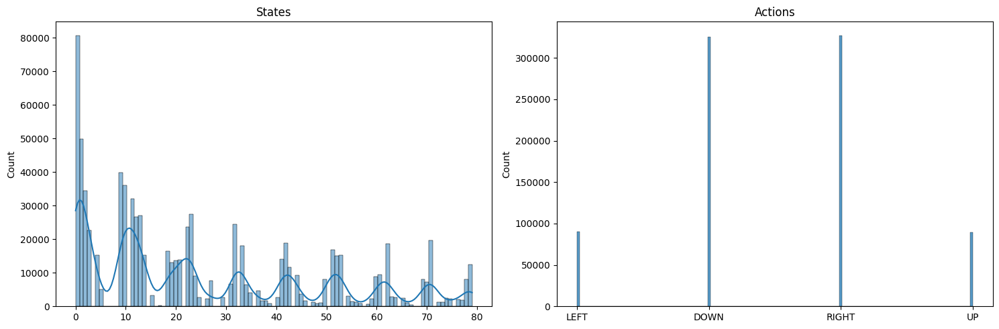

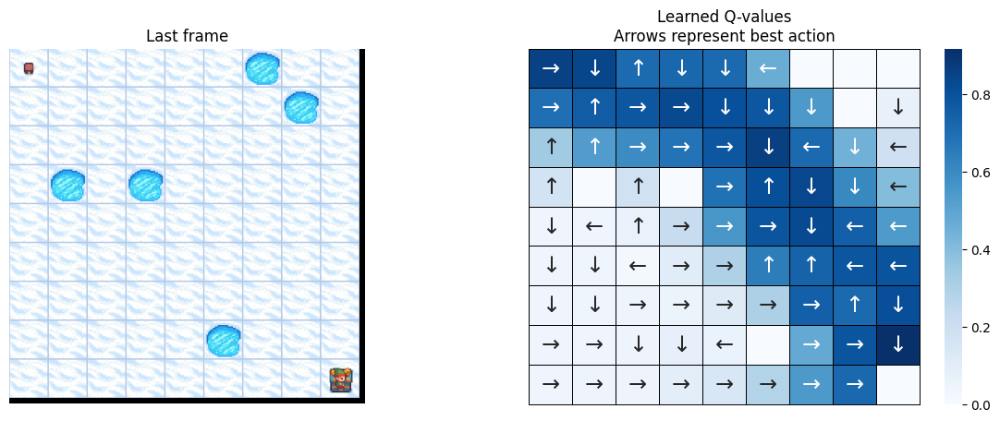

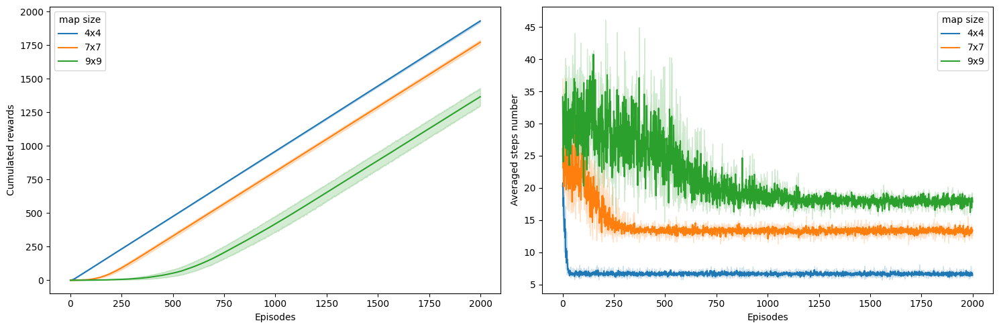

Map size: 9x9 | Learning Rate: 0.9


Cumulative reward: 1308.0


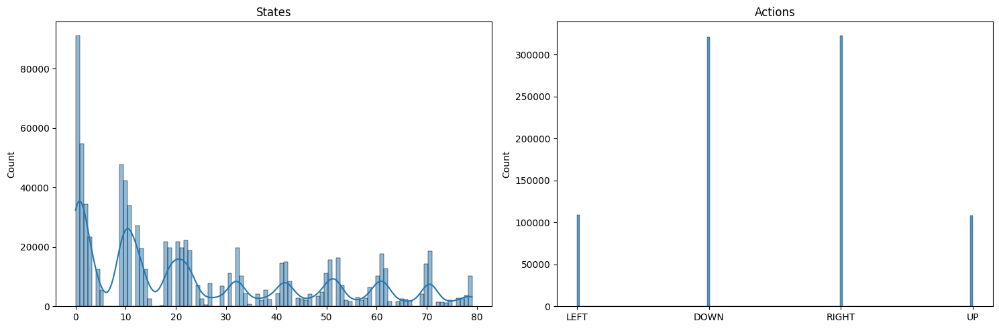

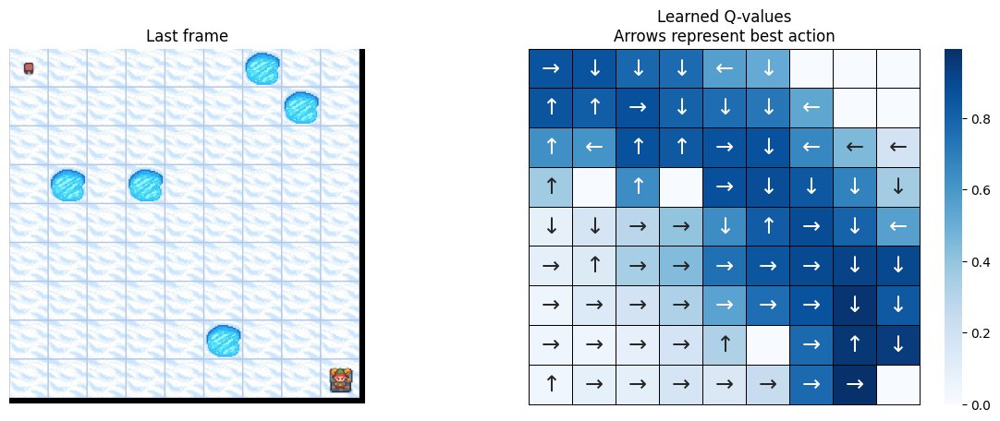

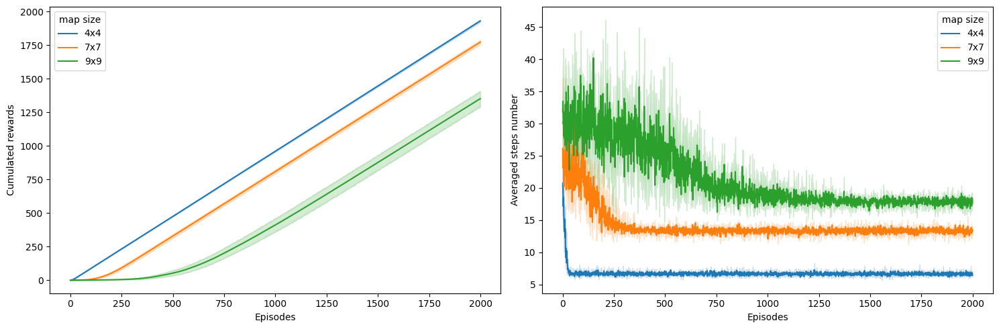

Map size: 11x11 | Learning Rate: 0.01


Cumulative reward: 1304.0


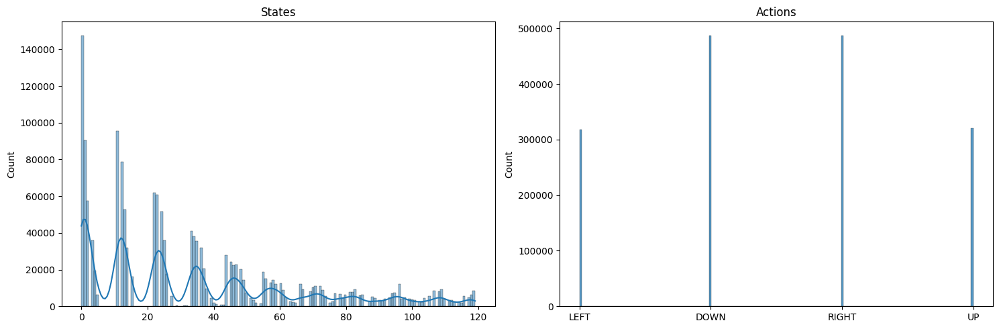

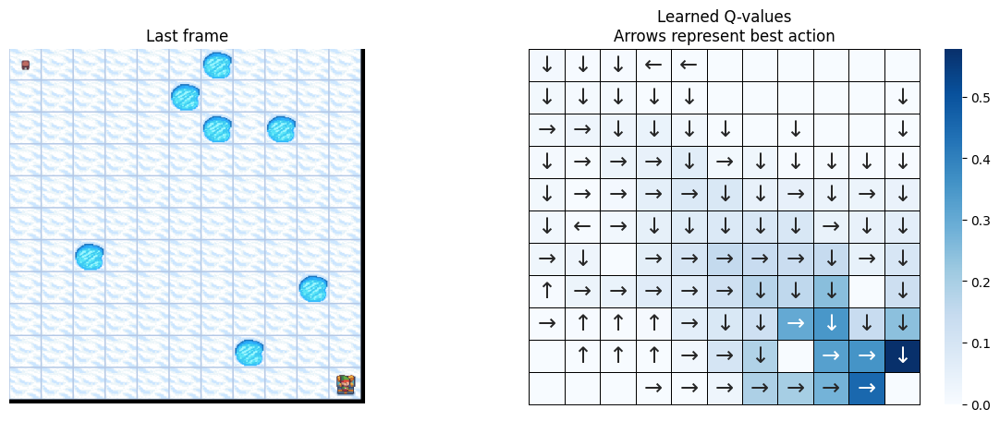

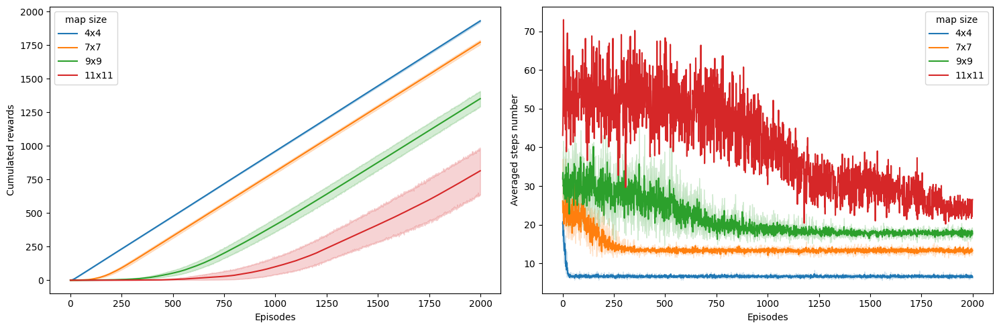

Map size: 11x11 | Learning Rate: 0.5


Cumulative reward: 1191.0


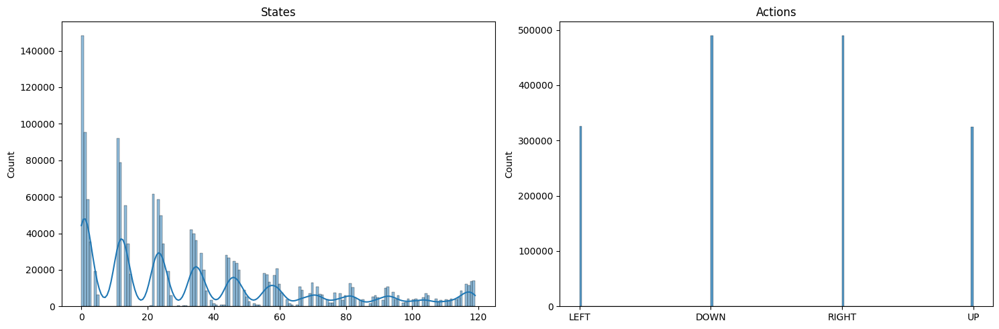

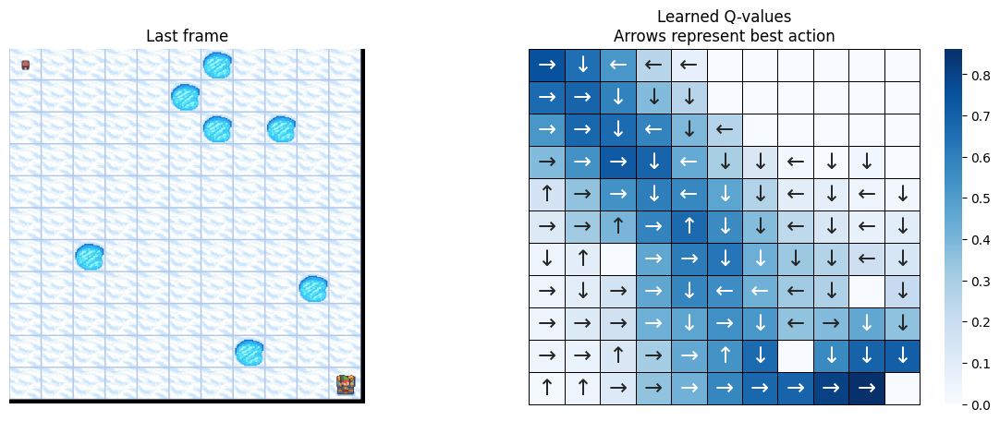

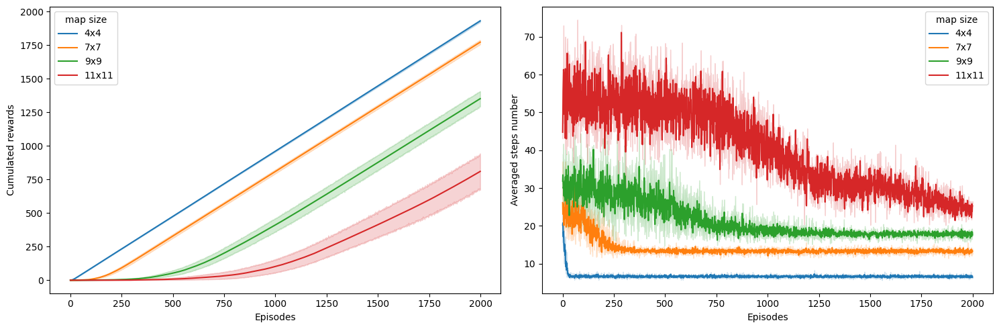

Map size: 11x11 | Learning Rate: 0.9


Cumulative reward: 1173.0


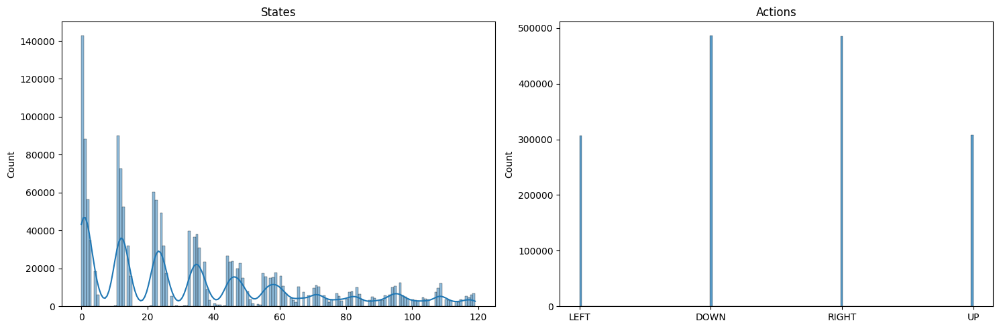

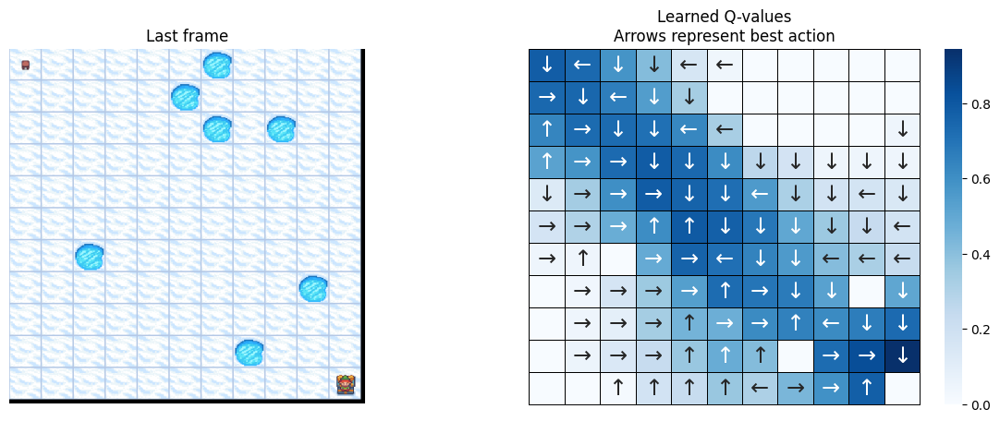

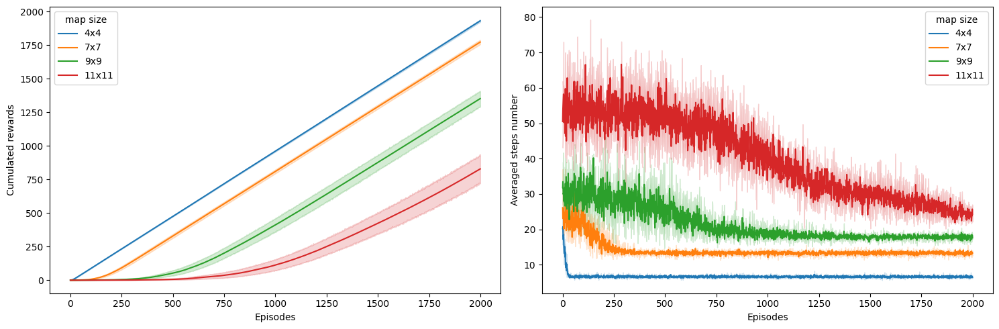

In [14]:
lr_values = [0.01, 0.5, 0.90]
map_sizes = [4, 7, 9, 11]
res_all = pd.DataFrame()
st_all = pd.DataFrame()

for map_size in map_sizes:
    for lr in lr_values:
        print(f"Map size: {map_size}x{map_size} | Learning Rate: {lr}")

        env = gym.make(
            "FrozenLake-v1",
            is_slippery=params.is_slippery,
            render_mode="rgb_array",
            desc=generate_random_map(
                size=map_size, p=params.proba_frozen, seed=params.seed
            ),
        )

        # Updating params for current lr and map size
        params = params._replace(
            action_size=env.action_space.n,
            state_size=env.observation_space.n,
            learning_rate=lr
        )

        env.action_space.seed(params.seed)

        learner = Qlearning(
            learning_rate=params.learning_rate,
            gamma=params.gamma,
            state_size=params.state_size,
            action_size=params.action_size,
        )
        explorer = EpsilonGreedy(
            epsilon=params.epsilon,
        )

        rewards, steps, episodes, qtables, all_states, all_actions = run_env()

        # Saving the results with current lr and map_size
        res, st = postprocess(episodes, params, rewards, steps, map_size)

        # Printing the cumulative reward
        cumulative_reward = res['cum_rewards'].iloc[-1]
        print(f"Cumulative reward: {cumulative_reward}")
        
        res["lr"] = lr
        st["lr"] = lr
        res_all = pd.concat([res_all, res])
        st_all = pd.concat([st_all, st])
        qtable = qtables.mean(axis=0)

        plot_states_actions_distribution(
            states=all_states, actions=all_actions, map_size=map_size, 
            gamma=params.gamma, lr=params.learning_rate
        )  # Sanity check
        plot_q_values_map(qtable, env, map_size, params.gamma, params.learning_rate)
        plot_steps_and_rewards(res_all, st_all, params.gamma, params.learning_rate)

        env.close()

## Relationship Between Learning Rate and Cumulative Reward

I varied the learning rate across the values 0.01, 0.5 and 0.9 to see how it affects cumulative rewards over the Frozen Lake environment across different map sizes (4x4, 7x7, 9x9 and 11x11). The results showed diverging trends: lower learning rates seemed to produce higher cumulative rewards particularly on simpler maps, whereas greater values produced poorer performance.

For the 4x4 map, the cumulative reward was highest when the learning rate was 0.01. When I increased the learning rate to 0.5 and 0.9 the cumulative rewards decreased slightly suggesting that the agent became less stable as it learned its knowledge more aggressively. The same pattern was observed using the 7x7 map, with the cumulative reward decreasing with increasing learning rates.

On the 9x9 grid, I observed an interesting deviation: a learning rate of 0.5 produced the largest cumulative reward, outperforming both lower (0.01) and higher (0.9) rates. This shows that in moderate-complexity environments, an optimal learning rate allowed the agent to learn successfully without being overly conservative. On the 11x11 grid, the same trend was observed. Though the optimal reward was still attained at the smallest learning rate (0.01), the gap between performance in different learning rates diminished, which implies that in larger and more complex environments, faster adaptation through an intermediate learning rate could still be somewhat beneficial.

From these results, I learned that smaller learning rates tended to yield more stable and improved learning, particularly on smaller maps. Large learning rates, such as 0.9, had the tendency to cause the agent to update its policy too frequently and produce oscillatory behavior and poor convergence. However, in more complicated environments, a moderate learning rate could sometimes achieve a good balance point between exploration and rate of convergence.

---

### Summary Table: Learning Rate vs Cumulative Rewards

| Map Size | LR = 0.01 | LR = 0.5 | LR = 0.9 |
|:--------:|:---------:|:--------:|:--------:|
| 4x4      | 1990.0    | 1932.0   | 1923.0   |
| 7x7      | 1808.0    | 1763.0   | 1715.0   |
| 9x9      | 1242.0    | 1646.0   | 1308.0   |
| 11x11    | 1304.0    | 1191.0   | 1173.0   |


# Code a DDQN and solve the Lunar Lander V2 environment

Episode 100	Average Score: -165.56
Episode 200	Average Score: -111.53
Episode 300	Average Score: -49.761
Episode 400	Average Score: -15.27
Episode 500	Average Score: 50.755
Episode 600	Average Score: 116.05
Episode 700	Average Score: 183.25
Episode 717	Average Score: 200.02
Environment solved in 717 episodes!	Average Score: 200.02


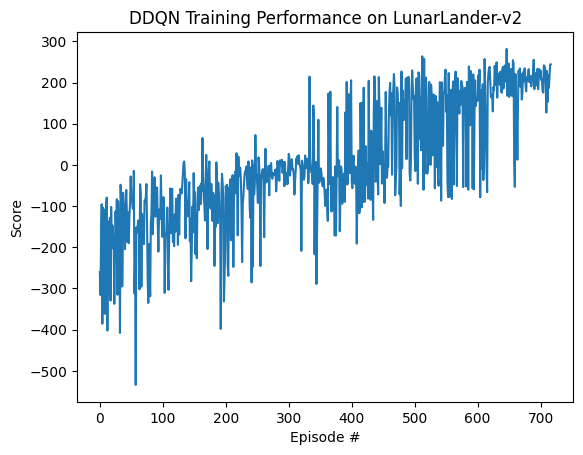

In [16]:
from dqn import Agent
import torch
import numpy as np
np.bool8 = np.bool_
import gym
import matplotlib.pyplot as plt
from collections import deque

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

env = gym.make('LunarLander-v2')
agent = Agent(state_size=8, action_size=4, seed=0)

def ddqn_train(n_episodes=2000, max_t=1000, eps_start=1.0, eps_end=0.01, eps_decay=0.995):
    scores = []
    scores_window = deque(maxlen=100)
    eps = eps_start
    for i_episode in range(1, n_episodes+1):
        state, _ = env.reset()
        score = 0
        for t in range(max_t):
            action = agent.act(state, eps)
            next_state, reward, terminated, truncated, _ = env.step(action)
            done = terminated or truncated
            agent.step(state, action, reward, next_state, done)
            state = next_state
            score += reward
            if done:
                break
        scores_window.append(score)
        scores.append(score)
        eps = max(eps_end, eps_decay*eps)

        print(f'\rEpisode {i_episode}\tAverage Score: {np.mean(scores_window):.2f}', end="")
        if i_episode % 100 == 0:
            print(f'\rEpisode {i_episode}\tAverage Score: {np.mean(scores_window):.2f}')
        if np.mean(scores_window) >= 200.0:
            print(f'\nEnvironment solved in {i_episode} episodes!\tAverage Score: {np.mean(scores_window):.2f}')
            torch.save(agent.qnetwork_local.state_dict(), 'ddqn_checkpoint.pth')
            break
    return scores

# Training and plotting
scores = ddqn_train()

plt.plot(np.arange(len(scores)), scores)
plt.ylabel('Score')
plt.xlabel('Episode #')
plt.title('DDQN Training Performance on LunarLander-v2')
plt.show()

# My Analysis
The agent, which was trained with DDQN, managed to solve the LunarLander-v2 environment. The agent's average score improved steadily during training, from very low values, into ultimately surpassing the barrier required to solve the environment. The environment was solved on episode 717, with the agent having an average score over the last 100 episodes above 200. This is to say that the agent learned to have a best policy for controlling the lander, balancing between fuel usage and safe landing. The learning dynamics were stable and performance increased with time.